In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import warnings
warnings.filterwarnings("ignore")

# EDA

Cчитаем датасеты и на время объединим их, чтобы было удобнее смотреть на EDA

In [2]:
tr = pd.read_csv("tr_for_students.csv")
vl = pd.read_csv("vl_for_students.csv")
tr = pd.concat([tr, vl], keys = ['train', 'test'])
tr

issue_d             purpose addr_state sub_grade  \
train 0      2012-01-01  debt_consolidation         IL        C3   
      1      2013-01-01  debt_consolidation         FL        B4   
      2      2013-07-01  debt_consolidation         NJ        B5   
      3      2014-03-01  debt_consolidation         MI        C2   
      4      2013-10-01         credit_card         TX        D2   
...                 ...                 ...        ...       ...   
test  60328  2014-10-01              moving         WV        E2   
      60329  2014-07-01         credit_card         VA        B5   
      60330  2014-09-01  debt_consolidation         WI        C3   
      60331  2015-04-01  debt_consolidation         CA        B3   
      60332  2015-01-01  debt_consolidation         AL        B5   

            home_ownership                    emp_title  installment    dti  \
train 0               RENT  Chicago Shakespeare Theatre       172.48  16.39   
      1           MORTGAGE               Queen of Pawns       674.94  16.31   
      2               RENT                 tek services       809.24  14.01   
      3           MORTGAGE            Inventory Control       342.56  14.51   
      4           MORTGAGE             Business Analyst       473.58  22.65   
...                    ...                          ...          ...    ...   
test  60328            OWN            Software Engineer        92.30  14.60   
      60329           RENT       Associate test manager      1070.37  13.60   
      60330            OWN          Executive Assistant       273.35  18.32   
      60331       MORTGAGE                   Parts tech       318.64  17.74   
      60332       MORTGAGE                      Manager      1162.34  18.18   

             funded_amnt  annual_inc  ...  mths_since_recent_inq  delinq_2yrs  \
train 0             5000     21600.0  ...                    NaN            0   
      1            20000     95000.0  ...                    4.0            0   
      2            24000     90000.0  ...                   19.0            0   
      3            10000     43000.0  ...                    5.0            1   
      4            13000     62000.0  ...                    5.0            0   
...                  ...         ...  ...                    ...          ...   
test  60328         2500     94500.0  ...                    3.0            0   
      60329        32000    110000.0  ...                   12.0            0   
      60330         8000     52000.0  ...                    6.0            0   
      60331        15000     52000.0  ...                    0.0            0   
      60332        35000    131200.0  ...                    1.0            0   

             chargeoff_within_12_mths  num_accts_ever_120_pd  \
train 0                             0                    NaN   
      1                             0                    0.0   
      2                             0                    0.0   
      3                             1                    4.0   
      4                             0                    0.0   
...                               ...                    ...   
test  60328                         0                    0.0   
      60329                         0                    0.0   
      60330                         0                    0.0   
      60331                         0                    0.0   
      60332                         0                    0.0   

             num_tl_90g_dpd_24m  acc_open_past_24mths  avg_cur_bal  \
train 0                     NaN                   NaN          NaN   
      1                     0.0                   4.0      23735.0   
      2                     0.0                   5.0       4070.0   
      3                     1.0                   3.0       1127.0   
      4                     0.0                   5.0       3443.0   
...                         ...                   ...          ...   
test  60328       

Посмотрим на распределение целевой переменной, а потом поработаем с пропусками

In [3]:
pie_df = pd.DataFrame(tr['def'].value_counts(normalize=True))
pie_df.reset_index(inplace=True)
pie_df['def'] = round(pie_df['def'], 2)
fig = px.pie(pie_df, values='def', names='index', color='index', color_discrete_map={1: '#9467BD', 0: '#FECB52'}, title='Non-Default (0) vs Default (1) Distribution')
fig.show()

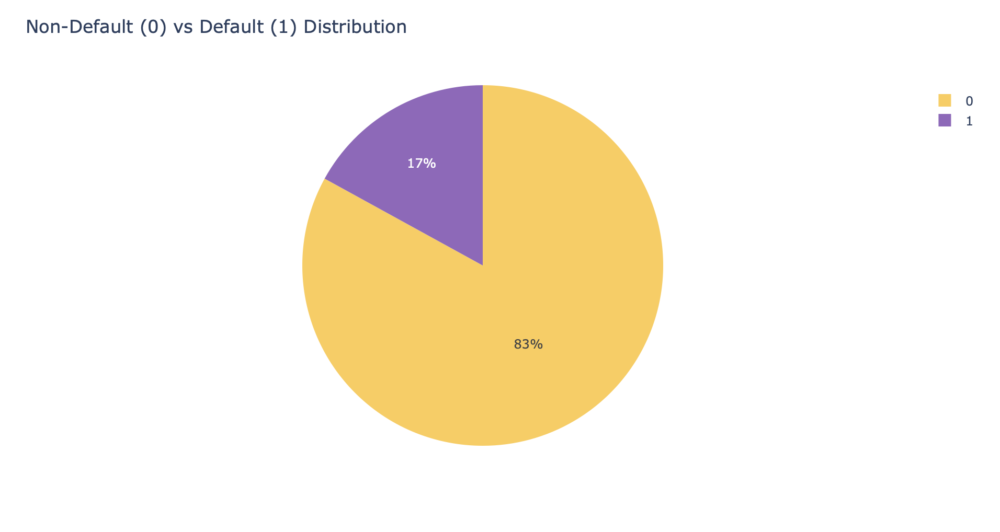

Отметим, что распределение таргета не равномерно. Будем использовать эту информацию при разделении выборки на train и test

In [4]:
dates = tr['issue_d'].astype(np.datetime64)
tr['issue_year'] = dates.apply(lambda x: x.year)
tr['issue_month'] = dates.apply(lambda x: x.month)
grouped = tr.groupby(['issue_year', 'issue_month'])
pl = {'time': [], 'def_ratio': [], 'class': []}
for x in grouped.indices:
    group = grouped.get_group(x)
    pl['time'].append(str(x[0]) + ', ' + str(x[1]))
    pl['time'].append(str(x[0]) + ', ' + str(x[1]))
    pl['def_ratio'].append(round(sum(group['def']) / len(group['def']), 4))
    pl['def_ratio'].append(1 - round(sum(group['def']) / len(group['def']), 4))
    pl['class'].append('def')
    pl['class'].append('non_def')
tr = tr.drop(columns = ['issue_year', 'issue_month'])
pl = pd.DataFrame(pl)
fig = px.bar(pl, x="time", y="def_ratio", color="class", color_discrete_map={'def': '#9467BD', 'non_def': '#FECB52'}, text_auto=True)
fig.update_layout(title = "Default / Non-default Distribution by Time")
fig.show()

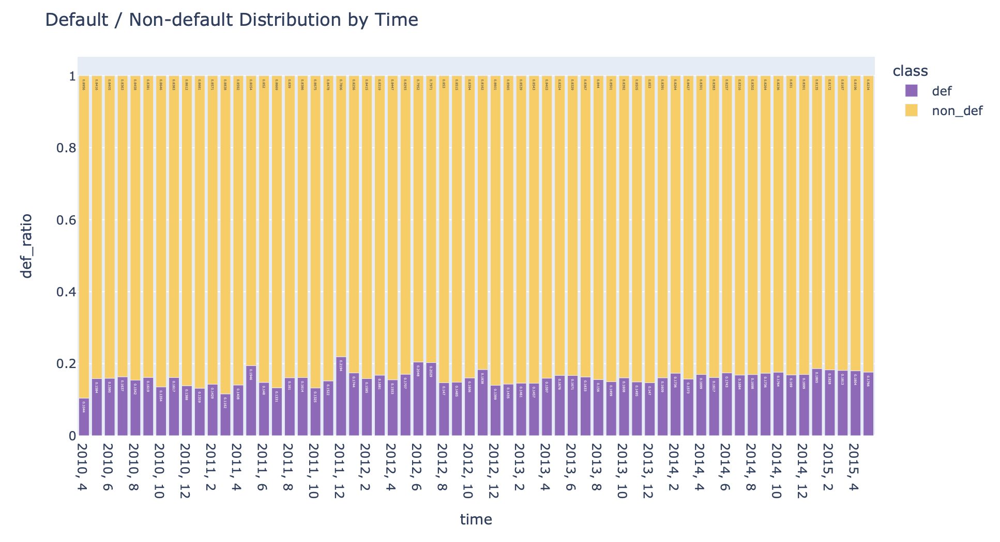

Видим, что во времени распределение таргета меняется не очень сильно

Теперь посмотрим на пропуски в данных

In [5]:
tr.isnull().sum()

issue_d                         0
purpose                         0
addr_state                      0
sub_grade                       0
home_ownership                  0
emp_title                    7011
installment                     0
dti                             0
funded_amnt                     0
annual_inc                      0
emp_length                   5809
term                            0
inq_last_6mths                  0
mths_since_recent_inq       19518
delinq_2yrs                     0
chargeoff_within_12_mths        0
num_accts_ever_120_pd       11941
num_tl_90g_dpd_24m          11941
acc_open_past_24mths         7886
avg_cur_bal                 11945
tot_hi_cred_lim             11941
delinq_amnt                     0
def                             0
dtype: int64

Видим, что колонки с количеством аккаунтов с задолженностями (>120 дней, >90 дней за последние 2 года), лимитом по кредиту и средним балансом по аккаунтам имеют практически одинаковое количество пропущенных значений. Проверим, одинаковые ли это строки

In [6]:
tr[tr['num_accts_ever_120_pd'].isnull()].isnull().sum()

issue_d                         0
purpose                         0
addr_state                      0
sub_grade                       0
home_ownership                  0
emp_title                     725
installment                     0
dti                             0
funded_amnt                     0
annual_inc                      0
emp_length                    414
term                            0
inq_last_6mths                  0
mths_since_recent_inq        8415
delinq_2yrs                     0
chargeoff_within_12_mths        0
num_accts_ever_120_pd       11941
num_tl_90g_dpd_24m          11941
acc_open_past_24mths         7886
avg_cur_bal                 11941
tot_hi_cred_lim             11941
delinq_amnt                     0
def                             0
dtype: int64

Видим, что это одни и те же люди. Возможно, это означает, что у человека до этого времени не было кредитов, поэтому данные недоступны. Заполним эти значения нулями и создадим колонку, которая будет говорить, было это значение заполнено или нет (0 – в колонках num_accts_ever_120_pd, num_tl_90g_dpd_24m, tot_hi_cred_lim не было NaN, 1 – был)

In [7]:
null_num_accts_ever_120_pd = tr[tr['num_accts_ever_120_pd'].isnull()].index

tr.loc[null_num_accts_ever_120_pd, 'num_accts_ever_120_pd'] = 0
tr.loc[null_num_accts_ever_120_pd, 'num_tl_90g_dpd_24m'] = 0
tr.loc[null_num_accts_ever_120_pd, 'avg_cur_bal'] = 0
tr.loc[null_num_accts_ever_120_pd, 'tot_hi_cred_lim'] = 0

tr.loc[null_num_accts_ever_120_pd, 'acc_open_past_24mths'] = 0

tr

issue_d             purpose addr_state sub_grade  \
train 0      2012-01-01  debt_consolidation         IL        C3   
      1      2013-01-01  debt_consolidation         FL        B4   
      2      2013-07-01  debt_consolidation         NJ        B5   
      3      2014-03-01  debt_consolidation         MI        C2   
      4      2013-10-01         credit_card         TX        D2   
...                 ...                 ...        ...       ...   
test  60328  2014-10-01              moving         WV        E2   
      60329  2014-07-01         credit_card         VA        B5   
      60330  2014-09-01  debt_consolidation         WI        C3   
      60331  2015-04-01  debt_consolidation         CA        B3   
      60332  2015-01-01  debt_consolidation         AL        B5   

            home_ownership                    emp_title  installment    dti  \
train 0               RENT  Chicago Shakespeare Theatre       172.48  16.39   
      1           MORTGAGE               Queen of Pawns       674.94  16.31   
      2               RENT                 tek services       809.24  14.01   
      3           MORTGAGE            Inventory Control       342.56  14.51   
      4           MORTGAGE             Business Analyst       473.58  22.65   
...                    ...                          ...          ...    ...   
test  60328            OWN            Software Engineer        92.30  14.60   
      60329           RENT       Associate test manager      1070.37  13.60   
      60330            OWN          Executive Assistant       273.35  18.32   
      60331       MORTGAGE                   Parts tech       318.64  17.74   
      60332       MORTGAGE                      Manager      1162.34  18.18   

             funded_amnt  annual_inc  ...  mths_since_recent_inq  delinq_2yrs  \
train 0             5000     21600.0  ...                    NaN            0   
      1            20000     95000.0  ...                    4.0            0   
      2            24000     90000.0  ...                   19.0            0   
      3            10000     43000.0  ...                    5.0            1   
      4            13000     62000.0  ...                    5.0            0   
...                  ...         ...  ...                    ...          ...   
test  60328         2500     94500.0  ...                    3.0            0   
      60329        32000    110000.0  ...                   12.0            0   
      60330         8000     52000.0  ...                    6.0            0   
      60331        15000     52000.0  ...                    0.0            0   
      60332        35000    131200.0  ...                    1.0            0   

             chargeoff_within_12_mths  num_accts_ever_120_pd  \
train 0                             0                    0.0   
      1                             0                    0.0   
      2                             0                    0.0   
      3                             1                    4.0   
      4                             0                    0.0   
...                               ...                    ...   
test  60328                         0                    0.0   
      60329                         0                    0.0   
      60330                         0                    0.0   
      60331                         0                    0.0   
      60332                         0                    0.0   

             num_tl_90g_dpd_24m  acc_open_past_24mths  avg_cur_bal  \
train 0                     0.0                   0.0          0.0   
      1                     0.0                   4.0      23735.0   
      2                     0.0                   5.0       4070.0   
      3                     1.0                   3.0       1127.0   
      4                     0.0                   5.0       3443.0   
...                         ...                   ...          ...   
test  60328       

Если нет запросов на кредиты за последние 6 месяцев и неизвестно время с последнего запроса, будем считать, что человек не делал запросов совсем (но сохраним информацию об этом в доп. колонку)

In [8]:
tr['mths_since_recent_inq'].value_counts()

1.0     11480
0.0      9277
2.0      8877
3.0      8006
4.0      7356
5.0      6648
6.0      5982
7.0      5869
8.0      5105
9.0      4506
10.0     3920
11.0     3384
12.0     3210
13.0     2764
14.0     2439
15.0     2133
16.0     1871
17.0     1648
18.0     1487
19.0     1327
20.0     1211
21.0     1104
22.0      998
23.0      928
24.0      453
25.0        1
Name: mths_since_recent_inq, dtype: int64

In [9]:
tr.loc[null_num_accts_ever_120_pd, 'mths_since_recent_inq'] = 0
tr['mths_since_recent_inq'].value_counts()

0.0     20836
1.0     11022
2.0      8528
3.0      7748
4.0      7134
5.0      6469
6.0      5798
7.0      5679
8.0      4912
9.0      4361
10.0     3791
11.0     3270
12.0     3103
13.0     2667
14.0     2353
15.0     2069
16.0     1821
17.0     1587
18.0     1442
19.0     1279
20.0     1170
21.0     1074
22.0      957
23.0      894
24.0      434
25.0        1
Name: mths_since_recent_inq, dtype: int64

In [10]:
tr.isnull().sum()

issue_d                         0
purpose                         0
addr_state                      0
sub_grade                       0
home_ownership                  0
emp_title                    7011
installment                     0
dti                             0
funded_amnt                     0
annual_inc                      0
emp_length                   5809
term                            0
inq_last_6mths                  0
mths_since_recent_inq       11103
delinq_2yrs                     0
chargeoff_within_12_mths        0
num_accts_ever_120_pd           0
num_tl_90g_dpd_24m              0
acc_open_past_24mths            0
avg_cur_bal                     4
tot_hi_cred_lim                 0
delinq_amnt                     0
def                             0
dtype: int64

Оставшиеся неизвестные значения о количестве месяцев заменим медианой

In [11]:
tr.loc[tr[tr['mths_since_recent_inq'].isnull()].index, 'mths_since_recent_inq'] = tr[tr['mths_since_recent_inq'].isnull() == False]['mths_since_recent_inq'].median()

Там, где очень мало значений, отличных от нуля, объединим их в одну группу "не ноль"

In [12]:
tr['delinq_2yrs'] = tr['delinq_2yrs'].apply(lambda x : x if x == 0 else 1)
tr['chargeoff_within_12_mths'] = tr['chargeoff_within_12_mths'].apply(lambda x : x if x == 0 else 1)
tr['num_accts_ever_120_pd'] = tr['num_accts_ever_120_pd'].apply(lambda x : x if x == 0 else 1)
tr['num_tl_90g_dpd_24m'] = tr['num_tl_90g_dpd_24m'].apply(lambda x : x if x == 0 else 1)
tr['delinq_amnt'] = tr['delinq_amnt'].apply(lambda x : x if x == 0 else 1)

Поработаем с названием должности

In [13]:
tr['employment_known'] = tr['emp_title'].apply(lambda x: 0 if pd.isna(x) else 1)
tr.loc[tr[tr['emp_title'].isnull()].index, 'emp_title'] = 'Unknown'
tr

issue_d             purpose addr_state sub_grade  \
train 0      2012-01-01  debt_consolidation         IL        C3   
      1      2013-01-01  debt_consolidation         FL        B4   
      2      2013-07-01  debt_consolidation         NJ        B5   
      3      2014-03-01  debt_consolidation         MI        C2   
      4      2013-10-01         credit_card         TX        D2   
...                 ...                 ...        ...       ...   
test  60328  2014-10-01              moving         WV        E2   
      60329  2014-07-01         credit_card         VA        B5   
      60330  2014-09-01  debt_consolidation         WI        C3   
      60331  2015-04-01  debt_consolidation         CA        B3   
      60332  2015-01-01  debt_consolidation         AL        B5   

            home_ownership                    emp_title  installment    dti  \
train 0               RENT  Chicago Shakespeare Theatre       172.48  16.39   
      1           MORTGAGE               Queen of Pawns       674.94  16.31   
      2               RENT                 tek services       809.24  14.01   
      3           MORTGAGE            Inventory Control       342.56  14.51   
      4           MORTGAGE             Business Analyst       473.58  22.65   
...                    ...                          ...          ...    ...   
test  60328            OWN            Software Engineer        92.30  14.60   
      60329           RENT       Associate test manager      1070.37  13.60   
      60330            OWN          Executive Assistant       273.35  18.32   
      60331       MORTGAGE                   Parts tech       318.64  17.74   
      60332       MORTGAGE                      Manager      1162.34  18.18   

             funded_amnt  annual_inc  ...  delinq_2yrs  \
train 0             5000     21600.0  ...            0   
      1            20000     95000.0  ...            0   
      2            24000     90000.0  ...            0   
      3            10000     43000.0  ...            1   
      4            13000     62000.0  ...            0   
...                  ...         ...  ...          ...   
test  60328         2500     94500.0  ...            0   
      60329        32000    110000.0  ...            0   
      60330         8000     52000.0  ...            0   
      60331        15000     52000.0  ...            0   
      60332        35000    131200.0  ...            0   

             chargeoff_within_12_mths  num_accts_ever_120_pd  \
train 0                             0                    0.0   
      1                             0                    0.0   
      2                             0                    0.0   
      3                             1                    1.0   
      4                             0                    0.0   
...                               ...                    ...   
test  60328                         0                    0.0   
      60329                         0                    0.0   
      60330                         0                    0.0   
      60331                         0                    0.0   
      60332                         0                    0.0   

             num_tl_90g_dpd_24m  acc_open_past_24mths  avg_cur_bal  \
train 0                     0.0                   0.0          0.0   
      1                     0.0                   4.0      23735.0   
      2                     0.0                   5.0       4070.0   
      3                     1.0                   3.0       1127.0   
      4                     0.0                   5.0       3443.0   
...                         ...                   ...          ...   
test  60328                 0.0                  11.0      18053.0   
      60329                 0.0                   2.0       4840.0   
      60330                 0.0                   6.0      23024.0   
      60331                 0.0                   4.0      22523.0   
      60332   

In [14]:
tr.loc[tr[tr['emp_length'].isnull()].index, 'emp_length'] = tr[tr['emp_length'].isnull() == False]['emp_length'].median()

In [15]:
tr.isnull().sum()

issue_d                     0
purpose                     0
addr_state                  0
sub_grade                   0
home_ownership              0
emp_title                   0
installment                 0
dti                         0
funded_amnt                 0
annual_inc                  0
emp_length                  0
term                        0
inq_last_6mths              0
mths_since_recent_inq       0
delinq_2yrs                 0
chargeoff_within_12_mths    0
num_accts_ever_120_pd       0
num_tl_90g_dpd_24m          0
acc_open_past_24mths        0
avg_cur_bal                 4
tot_hi_cred_lim             0
delinq_amnt                 0
def                         0
employment_known            0
dtype: int64

avg_cur_bal заменим медианным значением (не так критично, потому что неизвестных значений всего 4 из >60000)

In [16]:
tr.loc[tr[tr['avg_cur_bal'].isnull()].index, 'avg_cur_bal'] = tr[tr['avg_cur_bal'].isnull() == False]['avg_cur_bal'].median()
tr

issue_d             purpose addr_state sub_grade  \
train 0      2012-01-01  debt_consolidation         IL        C3   
      1      2013-01-01  debt_consolidation         FL        B4   
      2      2013-07-01  debt_consolidation         NJ        B5   
      3      2014-03-01  debt_consolidation         MI        C2   
      4      2013-10-01         credit_card         TX        D2   
...                 ...                 ...        ...       ...   
test  60328  2014-10-01              moving         WV        E2   
      60329  2014-07-01         credit_card         VA        B5   
      60330  2014-09-01  debt_consolidation         WI        C3   
      60331  2015-04-01  debt_consolidation         CA        B3   
      60332  2015-01-01  debt_consolidation         AL        B5   

            home_ownership                    emp_title  installment    dti  \
train 0               RENT  Chicago Shakespeare Theatre       172.48  16.39   
      1           MORTGAGE               Queen of Pawns       674.94  16.31   
      2               RENT                 tek services       809.24  14.01   
      3           MORTGAGE            Inventory Control       342.56  14.51   
      4           MORTGAGE             Business Analyst       473.58  22.65   
...                    ...                          ...          ...    ...   
test  60328            OWN            Software Engineer        92.30  14.60   
      60329           RENT       Associate test manager      1070.37  13.60   
      60330            OWN          Executive Assistant       273.35  18.32   
      60331       MORTGAGE                   Parts tech       318.64  17.74   
      60332       MORTGAGE                      Manager      1162.34  18.18   

             funded_amnt  annual_inc  ...  delinq_2yrs  \
train 0             5000     21600.0  ...            0   
      1            20000     95000.0  ...            0   
      2            24000     90000.0  ...            0   
      3            10000     43000.0  ...            1   
      4            13000     62000.0  ...            0   
...                  ...         ...  ...          ...   
test  60328         2500     94500.0  ...            0   
      60329        32000    110000.0  ...            0   
      60330         8000     52000.0  ...            0   
      60331        15000     52000.0  ...            0   
      60332        35000    131200.0  ...            0   

             chargeoff_within_12_mths  num_accts_ever_120_pd  \
train 0                             0                    0.0   
      1                             0                    0.0   
      2                             0                    0.0   
      3                             1                    1.0   
      4                             0                    0.0   
...                               ...                    ...   
test  60328                         0                    0.0   
      60329                         0                    0.0   
      60330                         0                    0.0   
      60331                         0                    0.0   
      60332                         0                    0.0   

             num_tl_90g_dpd_24m  acc_open_past_24mths  avg_cur_bal  \
train 0                     0.0                   0.0          0.0   
      1                     0.0                   4.0      23735.0   
      2                     0.0                   5.0       4070.0   
      3                     1.0                   3.0       1127.0   
      4                     0.0                   5.0       3443.0   
...                         ...                   ...          ...   
test  60328                 0.0                  11.0      18053.0   
      60329                 0.0                   2.0       4840.0   
      60330                 0.0                   6.0      23024.0   
      60331                 0.0                   4.0      22523.0   
      60332   

# Feature Engineering

Теперь создадим несколько новых признаков. Начнем с разбиения даты (issue_d) на год, месяц и день недели

In [17]:
dates = tr['issue_d'].astype(np.datetime64)
tr['issue_year'] = dates.apply(lambda x: x.year)
tr['issue_month'] = dates.apply(lambda x: x.month)
# признак число месяца не нужен, как и день недели – везде просто 1 число, а не реальная дата
tr = tr.drop(columns='issue_d', axis = 1)
tr

purpose addr_state sub_grade home_ownership  \
train 0      debt_consolidation         IL        C3           RENT   
      1      debt_consolidation         FL        B4       MORTGAGE   
      2      debt_consolidation         NJ        B5           RENT   
      3      debt_consolidation         MI        C2       MORTGAGE   
      4             credit_card         TX        D2       MORTGAGE   
...                         ...        ...       ...            ...   
test  60328              moving         WV        E2            OWN   
      60329         credit_card         VA        B5           RENT   
      60330  debt_consolidation         WI        C3            OWN   
      60331  debt_consolidation         CA        B3       MORTGAGE   
      60332  debt_consolidation         AL        B5       MORTGAGE   

                               emp_title  installment    dti  funded_amnt  \
train 0      Chicago Shakespeare Theatre       172.48  16.39         5000   
      1                   Queen of Pawns       674.94  16.31        20000   
      2                     tek services       809.24  14.01        24000   
      3                Inventory Control       342.56  14.51        10000   
      4                 Business Analyst       473.58  22.65        13000   
...                                  ...          ...    ...          ...   
test  60328            Software Engineer        92.30  14.60         2500   
      60329       Associate test manager      1070.37  13.60        32000   
      60330          Executive Assistant       273.35  18.32         8000   
      60331                   Parts tech       318.64  17.74        15000   
      60332                      Manager      1162.34  18.18        35000   

             annual_inc  emp_length  ...  num_accts_ever_120_pd  \
train 0         21600.0         0.0  ...                    0.0   
      1         95000.0        10.0  ...                    0.0   
      2         90000.0         3.0  ...                    0.0   
      3         43000.0        10.0  ...                    1.0   
      4         62000.0         1.0  ...                    0.0   
...                 ...         ...  ...                    ...   
test  60328     94500.0         6.0  ...                    0.0   
      60329    110000.0         0.0  ...                    0.0   
      60330     52000.0        10.0  ...                    0.0   
      60331     52000.0         3.0  ...                    0.0   
      60332    131200.0         1.0  ...                    0.0   

             num_tl_90g_dpd_24m  acc_open_past_24mths  avg_cur_bal  \
train 0                     0.0                   0.0          0.0   
      1                     0.0                   4.0      23735.0   
      2                     0.0                   5.0       4070.0   
      3                     1.0                   3.0       1127.0   
      4                     0.0                   5.0       3443.0   
...                         ...                   ...          ...   
test  60328                 0.0                  11.0      18053.0   
      60329                 0.0                   2.0       4840.0   
      60330                 0.0                   6.0      23024.0   
      60331                 0.0                   4.0      22523.0   
      60332                 0.0                   9.0       6546.0   

             tot_hi_cred_lim  delinq_amnt  def  employment_known  issue_year  \
train 0                  0.0            0    0                 1        2012   
      1             153379.0            0    0                 1        2013   
      2              50834.0            0    0                 1        2013   
      3              32683.0            0    0                 1        2014   
      4              59495.0            0    0                 1        2013   
...                      ...          ...  ...               ...         ...   
test  60328         391249.0            

Раньше мы работали с названием должности: попробуем сделать признаком длину названия (у высокооплачиваемых профессий обычно бывают длинные названия)

In [18]:
tr['emp_title_length'] = tr['emp_title'].apply(lambda x: len(x) if x != 'Unknown' else 0)

Далее посмотрим на распределения таргета в зависимости от значения sub_grade и созданного при помощи этой колонки значения признака grade (более общий). Для этого создадим функцию, которая будет рисовать нам красивое распределение таргета в зависимости от значений заданного признака, и назовем ее build_default_distribution(feature)

In [19]:
def build_default_distribution(feature):
    column_def = tr[tr['def'] == 1][feature].value_counts()
    column_non = tr[tr['def'] == 0][feature].value_counts()
    df = pd.DataFrame({'default' : column_def, 'non' : column_non})
    df['def_%'] = round(df['default'] / (df['default'] + df['non']), 2)
    df['non_%'] = round(df['non'] / (df['default'] + df['non']), 2)
    df = df.drop(columns = ['default', 'non'])
    df.reset_index(inplace=True)
    df = df.rename(columns = {'index' : feature})
    
    df1 = df.loc[df.index, [feature, 'def_%']]
    df1['class'] = ['default'] * len(df1)
    df1 = df1.rename(columns = {'def_%' : 'proportion'})
    
    df2 = df.loc[df.index, [feature, 'non_%']]
    df2['class'] = ['non-default'] * len(df2)
    df2 = df2.rename(columns = {'non_%' : 'proportion'})
    
    df_new = pd.concat([df1, df2])
    fig = px.bar(df_new, x=feature, y="proportion", color="class", color_discrete_map={'default': '#9467BD', 'non-default': '#FECB52'}, text_auto=True)
    fig.update_layout(title = "Default / Non-default Distribution by " + feature)
    fig.show()

In [20]:
tr['grade'] = tr['sub_grade'].apply(lambda x : x[0])
tr['grade'].value_counts()

B    34701
C    33407
A    19937
D    19764
E     9636
F     3244
G      813
Name: grade, dtype: int64

In [21]:
build_default_distribution("grade")
build_default_distribution("sub_grade")

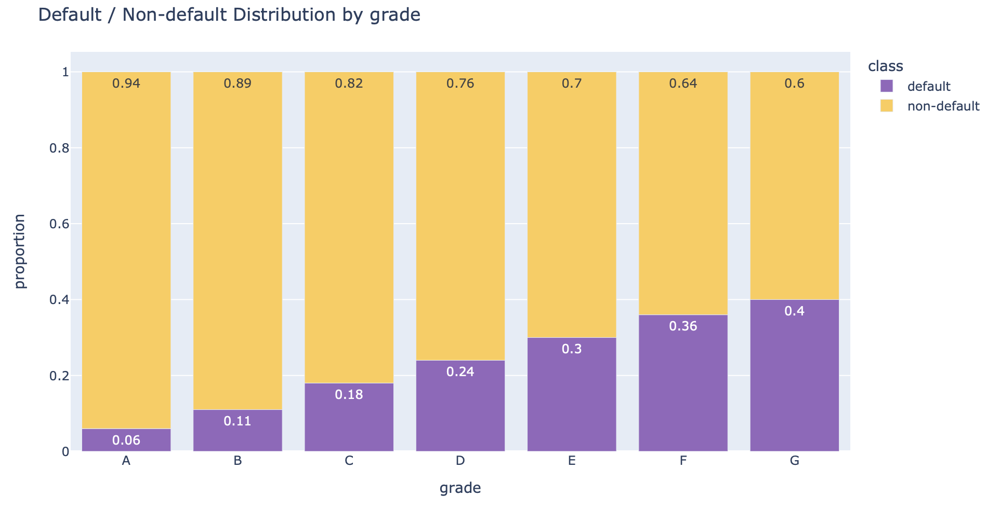

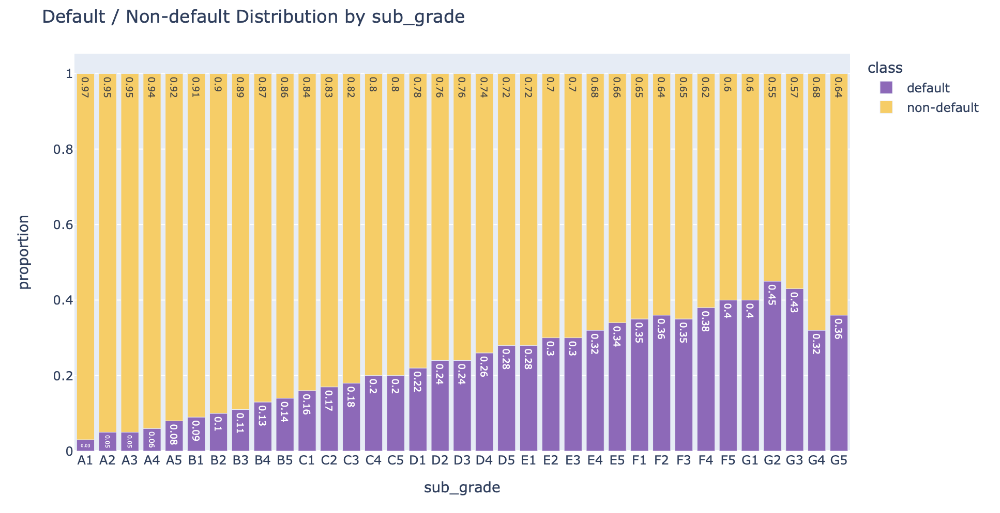

Будем иметь в виду, что в будущем будет использоваться WOE-преобразование признаков, поэтому сохраним признак grade вместо sub_grade, так как по нему зависимость таргета видна более четко

Значений у колонки с штатом очень много, при этом не все они репрезентативны, так как соответствуют всего нескольким потенциальным заемщикам

In [22]:
tr['addr_state'].value_counts(normalize=True)

CA    0.148804
NY    0.083645
TX    0.078558
FL    0.067843
IL    0.039571
NJ    0.037687
PA    0.035185
OH    0.032938
GA    0.032329
VA    0.030279
NC    0.028790
MI    0.025860
MD    0.024222
MA    0.022938
AZ    0.022823
WA    0.022526
CO    0.021605
MN    0.017926
MO    0.016156
IN    0.015317
CT    0.015218
NV    0.014724
TN    0.013819
WI    0.013498
OR    0.013029
AL    0.012650
LA    0.011597
SC    0.011531
KY    0.009506
KS    0.008955
OK    0.008576
AR    0.007605
UT    0.007358
NM    0.005490
WV    0.005391
HI    0.005284
NH    0.004765
RI    0.004395
MS    0.003473
MT    0.003053
AK    0.002955
DE    0.002872
DC    0.002839
WY    0.002288
SD    0.002091
VT    0.002033
IA    0.000008
Name: addr_state, dtype: float64

In [23]:
freq_states = tr['addr_state'].value_counts(normalize=True)[:5]
tr['addr_state'] = tr['addr_state'].apply(lambda x: x if x in freq_states else 'Rare')

Теперь удалим ненужные колонки

In [24]:
tr = tr.drop(columns = ['sub_grade', 'emp_title'])

Изменим информацию о собственном доме:

In [25]:
tr['home_ownership'] = tr['home_ownership'].apply(lambda x: x if x != 'NONE' else 'OTHER')

Теперь посмотрим на описательные статистики:

In [26]:
tr.describe()

,installment,dti,funded_amnt,annual_inc,emp_length,term,inq_last_6mths,mths_since_recent_inq,delinq_2yrs,chargeoff_within_12_mths,...,num_tl_90g_dpd_24m,acc_open_past_24mths,avg_cur_bal,tot_hi_cred_lim,delinq_amnt,def,employment_known,issue_year,issue_month,emp_title_length
count,121502.000000,121502.000000,121502.000000,1.215020e+05,121502.000000,121502.000000,121502.000000,121502.000000,121502.000000,121502.000000,...,121502.000000,121502.000000,121502.000000,1.215020e+05,121502.000000,121502.000000,121502.000000,121502.000000,121502.000000,121502.000000
mean,436.250343,17.756936,14597.043464,7.410526e+04,6.036213,43.034156,0.735535,5.957499,0.185873,0.007473,...,0.051612,3.890594,12069.868241,1.523699e+05,0.003185,0.168104,0.942297,2013.677709,6.083727,15.397450
std,243.356861,8.059351,8351.943362,6.126074e+04,3.554166,10.924348,1.010732,5.731851,0.389006,0.086124,...,0.221244,3.026160,15528.612686,1.696062e+05,0.056347,0.373960,0.233181,1.143545,3.438666,8.637517
min,4.930000,0.000000,1000.000000,6.000000e+03,0.000000,36.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,2010.000000,1.000000,0.000000
25%,261.750000,11.740000,8000.000000,4.500000e+04,3.000000,36.000000,0.000000,1.000000,0.000000,0.000000,...,0.000000,2.000000,2294.000000,3.576050e+04,0.000000,0.000000,1.000000,2013.000000,3.000000,9.000000
50%,382.550000,17.350000,12750.000000,6.373400e+04,6.000000,36.000000,0.000000,4.000000,0.000000,0.000000,...,0.000000,3.000000,5987.000000,8.889500e+04,0.000000,0.000000,1.000000,2014.000000,6.000000,15.000000
75%,570.710000,23.390000,20000.000000,9.000000e+04,10.000000,60.000000,1.000000,9.000000,0.000000,0.000000,...,0.000000,6.000000,17209.500000,2.296952e+05,0.000000,0.000000,1.000000,2014.000000,9.000000,21.000000
max,1408.130000,39.990000,35000.000000,7.500000e+06,10.000000,60.000000,8.000000,25.000000,1.000000,1.000000,...,1.000000,37.000000,358652.000000,9.999999e+06,1.000000,1.000000,1.000000,2015.000000,12.000000,64.000000


Добавим признак, означающий отношение суммы займа к доходу (если оно не очень большое, то, скорее всего, заемщик сможет выплатить кредит). Кроме того, создадим признак отношения среднего количества денег на счетах заемщика к сумме займа (чем больше оно, тем вероятнее, что заемщик будет способен выплатить долг)

In [27]:
tr['loan_to_income'] = tr['funded_amnt'] / tr['annual_inc']
tr['avg_balance_to_funded_amnt'] = tr['avg_cur_bal'] / tr['funded_amnt']
tr

purpose addr_state home_ownership  installment    dti  \
train 0      debt_consolidation         IL           RENT       172.48  16.39   
      1      debt_consolidation         FL       MORTGAGE       674.94  16.31   
      2      debt_consolidation       Rare           RENT       809.24  14.01   
      3      debt_consolidation       Rare       MORTGAGE       342.56  14.51   
      4             credit_card         TX       MORTGAGE       473.58  22.65   
...                         ...        ...            ...          ...    ...   
test  60328              moving       Rare            OWN        92.30  14.60   
      60329         credit_card       Rare           RENT      1070.37  13.60   
      60330  debt_consolidation       Rare            OWN       273.35  18.32   
      60331  debt_consolidation         CA       MORTGAGE       318.64  17.74   
      60332  debt_consolidation       Rare       MORTGAGE      1162.34  18.18   

             funded_amnt  annual_inc  emp_length  term  inq_last_6mths  ...  \
train 0             5000     21600.0         0.0    36               3  ...   
      1            20000     95000.0        10.0    36               1  ...   
      2            24000     90000.0         3.0    36               0  ...   
      3            10000     43000.0        10.0    36               1  ...   
      4            13000     62000.0         1.0    36               3  ...   
...                  ...         ...         ...   ...             ...  ...   
test  60328         2500     94500.0         6.0    36               0  ...   
      60329        32000    110000.0         0.0    36               0  ...   
      60330         8000     52000.0        10.0    36               0  ...   
      60331        15000     52000.0         3.0    60               0  ...   
      60332        35000    131200.0         1.0    36               0  ...   

             tot_hi_cred_lim  delinq_amnt  def  employment_known  issue_year  \
train 0                  0.0            0    0                 1        2012   
      1             153379.0            0    0                 1        2013   
      2              50834.0            0    0                 1        2013   
      3              32683.0            0    0                 1        2014   
      4              59495.0            0    0                 1        2013   
...                      ...          ...  ...               ...         ...   
test  60328         391249.0            0    0                 1        2014   
      60329          64200.0            0    0                 1        2014   
      60330         223121.0            0    0                 1        2014   
      60331         304634.0            0    0                 1        2015   
      60332         239358.0            0    1                 1        2015   

             issue_month  emp_title_length  grade  loan_to_income  \
train 0                1                27      C        0.231481   
      1                1                14      B        0.210526   
      2                7                12      B        0.266667   
      3                3                17      C        0.232558   
      4               10                16      D        0.209677   
...                  ...               ...    ...             ...   
test  60328           10                17      E        0.026455   
      60329            7                22      B        0.290909   
      60330            9                19      C        0.153846   
      60331            4                10      B        0.288462   
      60332            1                 7      B        0.266768   

             avg_balance_to_funded_amnt  
train 0                        0.000000  
      1                        1.186750  
      2                        0.169583  
      3                        0.112700  
      4                        0.264846  
...                                 ...  
test  60328       

Так как часто на этапе подачи заявки на кредит еще неизвестен ежемесячный платеж, то исключим этот признак позже (при вычислении woe) и не будем использовать его при обучении моделей. Вместо этого создадим свой признак из фичей, которые точно должны быть известны: сумма кредита и количество месяцев, на которое этот кредит хочет взять человек (у нас будет погрешность в виде процентов на сумму долга, однако это будет неплохим приближением). С его помощью мы найдем, во сколько раз сумма ежемесячного дохода больше, чем приближенная сумма, которую должен платить заемщик каждый месяц (без знания о процентной ставке)

In [28]:
tr['mth_inc_to_payment'] = (tr['annual_inc'] / 12) / (tr['funded_amnt'] / tr['term'])
tr

purpose addr_state home_ownership  installment    dti  \
train 0      debt_consolidation         IL           RENT       172.48  16.39   
      1      debt_consolidation         FL       MORTGAGE       674.94  16.31   
      2      debt_consolidation       Rare           RENT       809.24  14.01   
      3      debt_consolidation       Rare       MORTGAGE       342.56  14.51   
      4             credit_card         TX       MORTGAGE       473.58  22.65   
...                         ...        ...            ...          ...    ...   
test  60328              moving       Rare            OWN        92.30  14.60   
      60329         credit_card       Rare           RENT      1070.37  13.60   
      60330  debt_consolidation       Rare            OWN       273.35  18.32   
      60331  debt_consolidation         CA       MORTGAGE       318.64  17.74   
      60332  debt_consolidation       Rare       MORTGAGE      1162.34  18.18   

             funded_amnt  annual_inc  emp_length  term  inq_last_6mths  ...  \
train 0             5000     21600.0         0.0    36               3  ...   
      1            20000     95000.0        10.0    36               1  ...   
      2            24000     90000.0         3.0    36               0  ...   
      3            10000     43000.0        10.0    36               1  ...   
      4            13000     62000.0         1.0    36               3  ...   
...                  ...         ...         ...   ...             ...  ...   
test  60328         2500     94500.0         6.0    36               0  ...   
      60329        32000    110000.0         0.0    36               0  ...   
      60330         8000     52000.0        10.0    36               0  ...   
      60331        15000     52000.0         3.0    60               0  ...   
      60332        35000    131200.0         1.0    36               0  ...   

             delinq_amnt  def  employment_known  issue_year  issue_month  \
train 0                0    0                 1        2012            1   
      1                0    0                 1        2013            1   
      2                0    0                 1        2013            7   
      3                0    0                 1        2014            3   
      4                0    0                 1        2013           10   
...                  ...  ...               ...         ...          ...   
test  60328            0    0                 1        2014           10   
      60329            0    0                 1        2014            7   
      60330            0    0                 1        2014            9   
      60331            0    0                 1        2015            4   
      60332            0    1                 1        2015            1   

             emp_title_length  grade  loan_to_income  \
train 0                    27      C        0.231481   
      1                    14      B        0.210526   
      2                    12      B        0.266667   
      3                    17      C        0.232558   
      4                    16      D        0.209677   
...                       ...    ...             ...   
test  60328                17      E        0.026455   
      60329                22      B        0.290909   
      60330                19      C        0.153846   
      60331                10      B        0.288462   
      60332                 7      B        0.266768   

             avg_balance_to_funded_amnt  mth_inc_to_payment  
train 0                        0.000000           12.960000  
      1                        1.186750           14.250000  
      2                        0.169583           11.250000  
      3                        0.112700           12.900000  
      4                        0.264846           14.307692  
...                                 ...                 ...  
test  60328                    7.221200          113.400000  
      60329         

In [29]:
tr.columns

Index(['purpose', 'addr_state', 'home_ownership', 'installment', 'dti',
       'funded_amnt', 'annual_inc', 'emp_length', 'term', 'inq_last_6mths',
       'mths_since_recent_inq', 'delinq_2yrs', 'chargeoff_within_12_mths',
       'num_accts_ever_120_pd', 'num_tl_90g_dpd_24m', 'acc_open_past_24mths',
       'avg_cur_bal', 'tot_hi_cred_lim', 'delinq_amnt', 'def',
       'employment_known', 'issue_year', 'issue_month', 'emp_title_length',
       'grade', 'loan_to_income', 'avg_balance_to_funded_amnt',
       'mth_inc_to_payment'],
      dtype='object')

**Отметим, почему не будут удалены следующие признаки, изначально находившиеся в датасете:**
1) purpose: причина, по которой берется займ; кредиты на небольшие покупки, скорее всего, будут выплачиваться чаще, а кредиты на "закрытие других кредитов" – вряд ли\
\
2) addr_state: место проживания заемщика может влиять на его кредитоспособность (например, из-за разного уровня в доходах)\
\
3) home_ownership: наличие дома у заемщика может говорить о его надежности, а наличие ипотеки – о его способности выплачивать займы\
\
4) dti: показатель, показывающий способность человека выплачивать кредит по его кредитной истории\
\
5) grade: внешняя оценка заемщика по его кредитной истории; логично, что человек с высокой оценкой имеет более хорошую кредитную историю, а потому более вероятно, что он сможет выплатить кредит\
\
6) funded_amnt: сумма кредита (если она слишком высокая, вероятно, человек не сможет выплатить кредит, а небольшие суммы, напротив, могут указывать на то, что клиент, скорее, выплатит кредит)\
\
7) annual_inc: ежегодный доход; показывает, есть ли у человека способность платить по кредиту, исходя из его возможности выплачивать определенную сумму по кредиту\
\
8) term: на какой период берется кредит (чем больше период, тем дольше заемщик должен осуществлять ежемесячные платежи, что может говорить о более низкой вероятности выплатить весь кредит без просрочек)\
\
9) employment_known: бинарный признак, известно ли место работы (если нет, возможно, нет стабильного источника дохода или работы вовсе, что влияет на кредитоспособность заемщика)\
\
10) delinq_2yrs: количество раз, когда просрочка по платежу превышала 30 дней за последние 2 года; говорит о способности клиента вовремя осуществлять платежи по займу\
\
11) inq_last_6mths: количество поданных заявок на кредит может говорить о количестве текущих кредитов, которые человек должен выплачивать, или свидетельствовать о том, что ранее при подаче заявки клиенту несколько раз было отказано\
\
12) num_accts_ever_120_pd: количество аккаунтов, на которых просрочка по платежу была больше 120 дней, указывает на способность заемщика вовремя выплачивать кредит\
\
13) avg_cur_bal: средний баланс на аккаунтах показывает, может ли заемщик позволить себе выплачивать определенную сумму по кредиту\
\
14) tot_hi_cred_lim: наибольшая сумма, которую был должен заемщик, указывает на его кредитную историю\
\
15) emp_title_length: длина названия профессии; может оказаться, что такой признак влияет, так как у более высокооплачиваемых профессий может быть более длинное название (для сравнения: продавец и старший заместитель финансового директора)\
\
**Следующие признаки будут использоваться для других моделей машинного обучения, но не для woe-регрессии, потому что даже после ручной расстановки бинов не было монотонности (или вовсе создавался один бакет):**
1) issue_year: год выдачи кредита; некоторые годы могут выпадать на кризис в экономике и влиять на кредитоспособность клиентов\
\
2) issue_month: месяц выдачи кредита; как и год, он может влиять на кредитоспособность\
\
3) mths_since_recent_inq: количество месяцев с последней заявки на кредит также говорит о том, как часто человек берет кредиты, что может влиять на его способность их выплачивать\
\
4) chargeoff_within_12_mths: количество раз, сколько человек не был способен выплачивать кредит за последние 2 года; признак показывает, насколько часто заемщик не выплачивает кредит\
\
5) num_tl_90g_dpd_24m: количество аккаунтов, на которых просрочка по платежу за последние 2 года была больше 90 дней, тоже указывает на способность заемщика вовремя выплачивать кредит\
\
6) acc_open_past_24mths: количество сделок с банком за последние 2 года – еще один признак, показывающий кредитную историю заемщика\
\
7) delinq_amnt: общая сумма задолженностей (если высокая, то, скорее всего, заемщик не сможет выплатить кредит)\
\
8) emp_length: количество лет в найме; показывает на стабильность источника заработка

# WOE-трансформация

Разделим tr на train и test, как было ранее, а также добавим midval: на этой выборке мы будем тестировать гиперпараметры

In [30]:
from sklearn.model_selection import train_test_split
tr_new = tr.loc['train']
test_new = tr.loc['test']
X_train, midval_X_test, y_train, midval_y_test = train_test_split(tr_new.drop(columns = 'def'), tr_new['def'], test_size = 0.2, random_state = 42, stratify = tr_new['def'])
tr_new = pd.concat([X_train, y_train], axis=1)
midval_new = pd.concat([midval_X_test, midval_y_test], axis=1)
tr_new

,purpose,addr_state,home_ownership,installment,dti,funded_amnt,annual_inc,emp_length,term,inq_last_6mths,...,delinq_amnt,employment_known,issue_year,issue_month,emp_title_length,grade,loan_to_income,avg_balance_to_funded_amnt,mth_inc_to_payment,def
2618,debt_consolidation,NY,RENT,198.66,5.57,5125,50000.0,7.0,36,0,...,0,1,2013,11,18,E,0.102500,0.146927,29.268293,0
29775,credit_card,CA,MORTGAGE,423.23,17.59,18000,85000.0,10.0,60,0,...,0,0,2014,1,0,C,0.211765,1.120667,23.611111,0
37815,credit_card,Rare,RENT,237.80,22.17,10000,27000.0,0.0,60,0,...,0,1,2014,1,11,C,0.370370,0.152200,13.500000,0
59399,debt_consolidation,Rare,MORTGAGE,597.76,15.35,24000,208300.0,10.0,60,1,...,0,1,2013,11,25,C,0.115218,0.954958,43.395833,0
51582,debt_consolidation,FL,RENT,437.96,21.12,13000,50000.0,8.0,36,1,...,0,1,2014,2,15,B,0.260000,0.222385,11.538462,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12295,other,Rare,MORTGAGE,232.09,16.00,10175,95004.0,4.0,60,0,...,0,1,2010,5,20,C,0.107101,0.000000,46.685012,0
50110,debt_consolidation,CA,RENT,207.79,18.63,5375,15456.0,6.0,36,3,...,0,0,2014,1,0,E,0.347761,0.371907,8.626605,0
2196,credit_card,CA,RENT,360.38,9.51,10000,46200.0,2.0,36,0,...,0,1,2013,4,15,D,0.216450,0.183400,13.860000,0
13606,debt_consolidation,Rare,RENT,194.68,12.89,6000,39000.0,4.0,36,0,...,0,1,2010,6,19,B,0.153846,0.000000,19.500000,0


Теперь посмотрим на woe, iv и графики с оптимальным разбиением, а потом построим регрессию

In [31]:
# после неудачных попыток пофиксить зависимость на графиках woe до напоминающей линейную в признаках
# issue_year, issue_month, mths_since_recent_inq, chargeoff_within_12_mths, num_tl_90g_dpd_24m,
# acc_open_past_24mths, delinq_amnt и emp_length было принято решение убрать эти признаки

# тем не менее даты будут нужны для валидационных тестов позже, поэтому оставим эти колонки,
# но не будем их использовать для обучения модели

tr_new = tr_new.drop(columns = ['emp_length', 'acc_open_past_24mths', 'mths_since_recent_inq', 'chargeoff_within_12_mths', 'num_tl_90g_dpd_24m', 'delinq_amnt'])
midval_new = midval_new.drop(columns = ['emp_length', 'acc_open_past_24mths', 'mths_since_recent_inq', 'chargeoff_within_12_mths', 'num_tl_90g_dpd_24m', 'delinq_amnt'])
test_new = test_new.drop(columns = ['emp_length', 'acc_open_past_24mths', 'mths_since_recent_inq', 'chargeoff_within_12_mths', 'num_tl_90g_dpd_24m', 'delinq_amnt'])

In [32]:
tr_nowoe = tr_new[tr_new.columns[tr_new.isin([0, 1]).all()]].copy()
non_bin_names = set(tr_new.columns) - set(['issue_year', 'issue_month', 'installment'])
tr_woe = tr_new[non_bin_names.union({'def'})].copy()
midval_woe = midval_new[non_bin_names.union({'def'})].copy()
test_woe = test_new[non_bin_names.union({'def'})].copy()

In [33]:
import scorecardpy as sc
bins = sc.woebin(tr_woe, y="def")

[INFO] creating woe binning ...


In [34]:
woe_iv_df = pd.concat(bins)
pd.set_option('display.max_rows', len(woe_iv_df))
woe_iv_df

variable  \
tot_hi_cred_lim            0             tot_hi_cred_lim   
                           1             tot_hi_cred_lim   
                           2             tot_hi_cred_lim   
                           3             tot_hi_cred_lim   
grade                      0                       grade   
                           1                       grade   
                           2                       grade   
                           3                       grade   
                           4                       grade   
term                       0                        term   
                           1                        term   
delinq_2yrs                0                 delinq_2yrs   
                           1                 delinq_2yrs   
funded_amnt                0                 funded_amnt   
                           1                 funded_amnt   
                           2                 funded_amnt   
                           3                 funded_amnt   
                           4                 funded_amnt   
inq_last_6mths             0              inq_last_6mths   
                           1              inq_last_6mths   
                           2              inq_last_6mths   
                           3              inq_last_6mths   
employment_known           0            employment_known   
                           1            employment_known   
dti                        0                         dti   
                           1                         dti   
                           2                         dti   
                           3                         dti   
                           4                         dti   
mth_inc_to_payment         0          mth_inc_to_payment   
                           1          mth_inc_to_payment   
                           2          mth_inc_to_payment   
                           3          mth_inc_to_payment   
annual_inc                 0                  annual_inc   
                           1                  annual_inc   
                           2                  annual_inc   
                           3                  annual_inc   
num_accts_ever_120_pd      0       num_accts_ever_120_pd   
                           1       num_accts_ever_120_pd   
purpose                    0                     purpose   
                           1                     purpose   
                           2                     purpose   
                           3                     purpose   
avg_balance_to_funded_amnt 0  avg_balance_to_funded_amnt   
                           1  avg_balance_to_funded_amnt   
                           2  avg_balance_to_funded_amnt   
addr_state                 0                  addr_state   
                           1                  addr_state   
                           2                  addr_state   
                           3                  addr_state   
                           4                  addr_state   
avg_cur_bal                0                 avg_cur_bal   
                           1                 avg_cur_bal   
                           2                 avg_cur_bal   
                           3                 avg_cur_bal   
emp_title_length           0            emp_title_length   
                           1            emp_title_length   
                           2            emp_title_length   
                           3            emp_title_length   
loan_to_income             0              loan_to_income   
                           1              loan_to_income   
                           2              loan_to_income   
                           3              loan_to_income   
home_ownership             0              home_ownership   
                           1              home_ownership   
                           2              home_ownership   

                           

In [35]:
pd.reset_option('display.max_rows')

{'tot_hi_cred_lim': <Figure size 432x288 with 2 Axes>,
 'grade': <Figure size 432x288 with 2 Axes>,
 'term': <Figure size 432x288 with 2 Axes>,
 'delinq_2yrs': <Figure size 432x288 with 2 Axes>,
 'funded_amnt': <Figure size 432x288 with 2 Axes>,
 'inq_last_6mths': <Figure size 432x288 with 2 Axes>,
 'employment_known': <Figure size 432x288 with 2 Axes>,
 'dti': <Figure size 432x288 with 2 Axes>,
 'mth_inc_to_payment': <Figure size 432x288 with 2 Axes>,
 'annual_inc': <Figure size 432x288 with 2 Axes>,
 'num_accts_ever_120_pd': <Figure size 432x288 with 2 Axes>,
 'purpose': <Figure size 432x288 with 2 Axes>,
 'avg_balance_to_funded_amnt': <Figure size 432x288 with 2 Axes>,
 'addr_state': <Figure size 432x288 with 2 Axes>,
 'avg_cur_bal': <Figure size 432x288 with 2 Axes>,
 'emp_title_length': <Figure size 432x288 with 2 Axes>,
 'loan_to_income': <Figure size 432x288 with 2 Axes>,
 'home_ownership': <Figure size 432x288 with 2 Axes>}

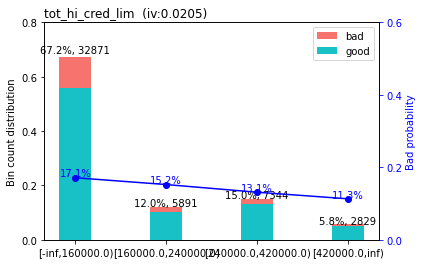

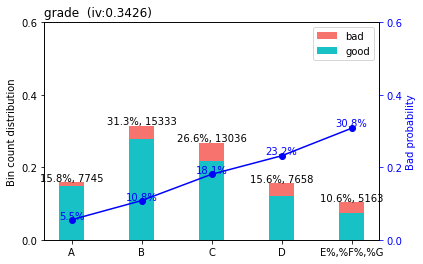

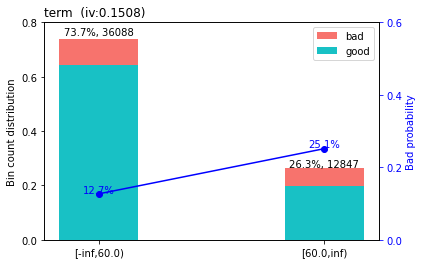

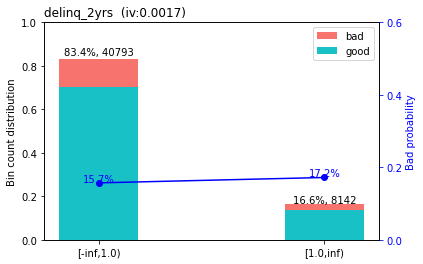

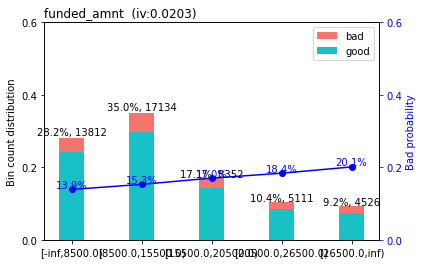

...

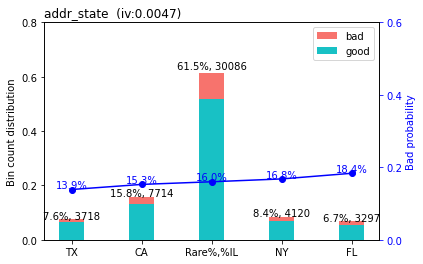

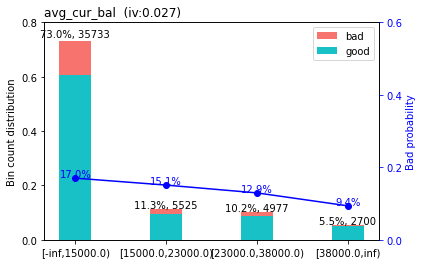

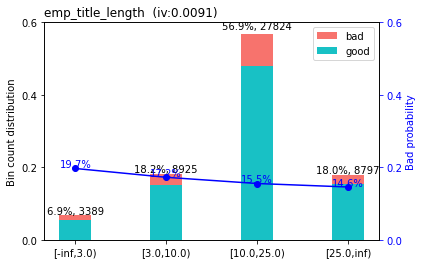

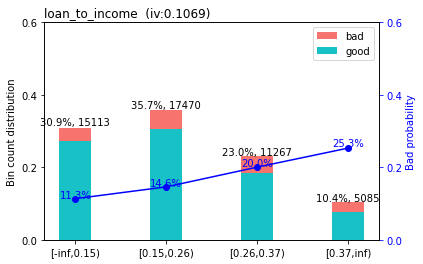

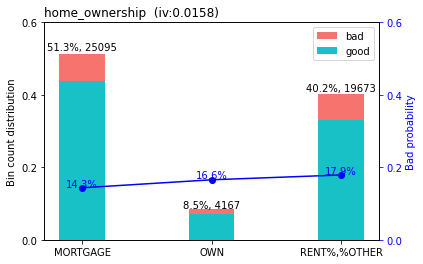

In [36]:
sc.woebin_plot(bins)

Изменим "характеристики" плохой(bad)-хороший(good), чтобы в качестве good отображались дефолтные заемщики (1 в колонке def)

In [37]:
bins_adj = sc.woebin(tr_woe, y="def", positive = 'def|0')

[INFO] creating woe binning ...


In [38]:
woe_iv_df = pd.concat(bins_adj)
pd.set_option('display.max_rows', len(woe_iv_df))
woe_iv_df

variable  \
tot_hi_cred_lim            0             tot_hi_cred_lim   
                           1             tot_hi_cred_lim   
                           2             tot_hi_cred_lim   
                           3             tot_hi_cred_lim   
grade                      0                       grade   
                           1                       grade   
                           2                       grade   
                           3                       grade   
                           4                       grade   
term                       0                        term   
                           1                        term   
delinq_2yrs                0                 delinq_2yrs   
                           1                 delinq_2yrs   
funded_amnt                0                 funded_amnt   
                           1                 funded_amnt   
                           2                 funded_amnt   
                           3                 funded_amnt   
                           4                 funded_amnt   
inq_last_6mths             0              inq_last_6mths   
                           1              inq_last_6mths   
                           2              inq_last_6mths   
                           3              inq_last_6mths   
employment_known           0            employment_known   
                           1            employment_known   
dti                        0                         dti   
                           1                         dti   
                           2                         dti   
                           3                         dti   
                           4                         dti   
mth_inc_to_payment         0          mth_inc_to_payment   
                           1          mth_inc_to_payment   
                           2          mth_inc_to_payment   
                           3          mth_inc_to_payment   
annual_inc                 0                  annual_inc   
                           1                  annual_inc   
                           2                  annual_inc   
                           3                  annual_inc   
num_accts_ever_120_pd      0       num_accts_ever_120_pd   
                           1       num_accts_ever_120_pd   
purpose                    0                     purpose   
                           1                     purpose   
                           2                     purpose   
                           3                     purpose   
avg_balance_to_funded_amnt 0  avg_balance_to_funded_amnt   
                           1  avg_balance_to_funded_amnt   
                           2  avg_balance_to_funded_amnt   
addr_state                 0                  addr_state   
                           1                  addr_state   
                           2                  addr_state   
                           3                  addr_state   
                           4                  addr_state   
avg_cur_bal                0                 avg_cur_bal   
                           1                 avg_cur_bal   
                           2                 avg_cur_bal   
                           3                 avg_cur_bal   
emp_title_length           0            emp_title_length   
                           1            emp_title_length   
                           2            emp_title_length   
                           3            emp_title_length   
loan_to_income             0              loan_to_income   
                           1              loan_to_income   
                           2              loan_to_income   
                           3              loan_to_income   
home_ownership             0              home_ownership   
                           1              home_ownership   
                           2              home_ownership   

                           

In [39]:
pd.reset_option('display.max_rows')

{'tot_hi_cred_lim': <Figure size 432x288 with 2 Axes>,
 'grade': <Figure size 432x288 with 2 Axes>,
 'term': <Figure size 432x288 with 2 Axes>,
 'delinq_2yrs': <Figure size 432x288 with 2 Axes>,
 'funded_amnt': <Figure size 432x288 with 2 Axes>,
 'inq_last_6mths': <Figure size 432x288 with 2 Axes>,
 'employment_known': <Figure size 432x288 with 2 Axes>,
 'dti': <Figure size 432x288 with 2 Axes>,
 'mth_inc_to_payment': <Figure size 432x288 with 2 Axes>,
 'annual_inc': <Figure size 432x288 with 2 Axes>,
 'num_accts_ever_120_pd': <Figure size 432x288 with 2 Axes>,
 'purpose': <Figure size 432x288 with 2 Axes>,
 'avg_balance_to_funded_amnt': <Figure size 432x288 with 2 Axes>,
 'addr_state': <Figure size 432x288 with 2 Axes>,
 'avg_cur_bal': <Figure size 432x288 with 2 Axes>,
 'emp_title_length': <Figure size 432x288 with 2 Axes>,
 'loan_to_income': <Figure size 432x288 with 2 Axes>,
 'home_ownership': <Figure size 432x288 with 2 Axes>}

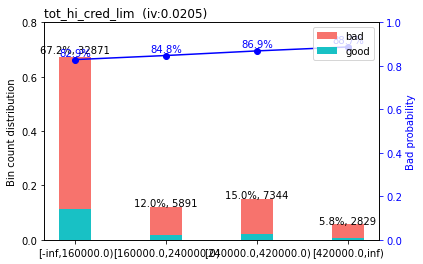

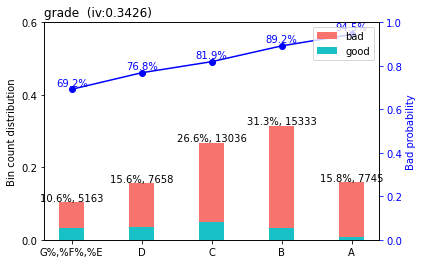

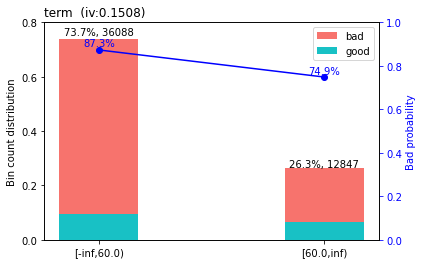

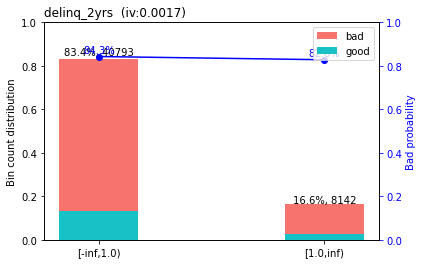

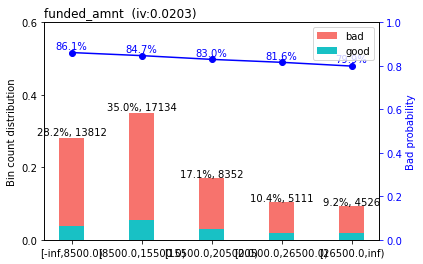

...

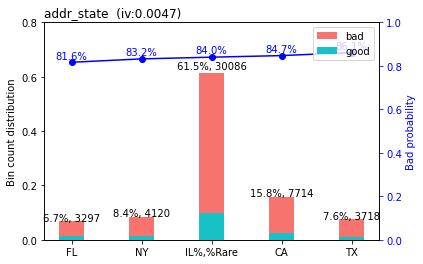

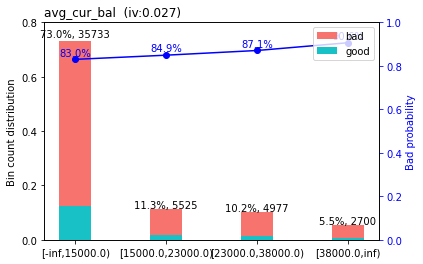

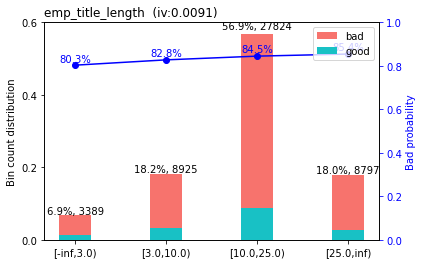

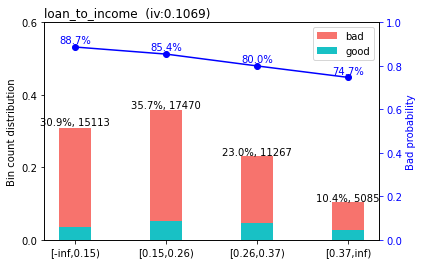

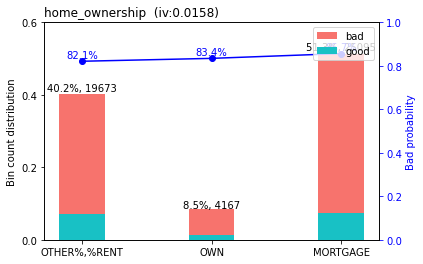

In [40]:
sc.woebin_plot(bins_adj)

In [41]:
tr_newwoe = sc.woebin_ply(tr_new, bins_adj)
midval_newwoe = sc.woebin_ply(midval_new, bins_adj)
test_newwoe = sc.woebin_ply(test_new, bins_adj)

[INFO] converting into woe values ...
[INFO] converting into woe values ...
[INFO] converting into woe values ...


Оставим колонку funded_amnt и installment для будущего расчета ожидаемой прибыли

In [42]:
tr_newwoe['funded_amnt'] = tr_woe['funded_amnt']
tr_newwoe['installment'] = tr_new['installment']
tr_newwoe['term'] = tr_woe['term']

midval_newwoe['funded_amnt'] = midval_woe['funded_amnt']
midval_newwoe['installment'] = midval_new['installment']
midval_newwoe['term'] = midval_woe['term']

test_newwoe['funded_amnt'] = test_woe['funded_amnt']
test_newwoe['installment'] = test_new['installment']
test_newwoe['term'] = test_woe['term']

Теперь мы заменили значения признаков на WOE, вычисленные ранее: заметим, что мы не стали удалять признаки, где iv < 0.02, поскольку из-за этого модель сильно теряла в качестве

# Логистическая регрессия с WOE-преобразованием признаков

Сначала будем работать с тренировочной и валидационной (на ней мы будем позже смотреть наиболее подходящие значения трешхолда, подобранные через оптимальное соотношение accuracy и recall, а так же через максимизацию прибыли) выборками, а потом вернемся к тестовой

In [57]:
X_train = tr_newwoe.drop(columns = 'def')
y_train = tr_newwoe['def']
midval_X_test = midval_newwoe.drop(columns = 'def')
midval_y_test = midval_newwoe['def']

funded_amnt = midval_X_test['funded_amnt']
installment = midval_X_test['installment']
term = midval_X_test['term']

X_train = X_train.drop(columns = ['funded_amnt', 'installment', 'term', 'issue_year', 'issue_month'])
midval_X_test = midval_X_test.drop(columns = ['funded_amnt', 'installment', 'term', 'issue_year', 'issue_month'])

Теперь подберем гиперпараметры логистической регрессии через Grid Search + Cross Validation

In [58]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold

params = {'C' : np.logspace(start = -3, stop = 0, num = 10),
          'penalty' : ['l1', 'l2', 'elasticnet'],
          'solver': ['liblinear', 'saga', 'lbfgs']}

skf = StratifiedKFold(n_splits=10)

lr = LogisticRegression(random_state = 42)
grid_lr = GridSearchCV(lr, params, cv = skf, scoring='roc_auc')
grid_lr.fit(X_train, y_train)

preds = grid_lr.predict_proba(midval_X_test)
print("Значение ROC AUC test: ", roc_auc_score(midval_y_test, preds[:, 1]))
print("Коэффициент Джини test:", roc_auc_score(midval_y_test, preds[:, 1]) * 2 - 1)

Значение ROC AUC test:  0.6830642031992883
Коэффициент Джини test: 0.3661284063985766


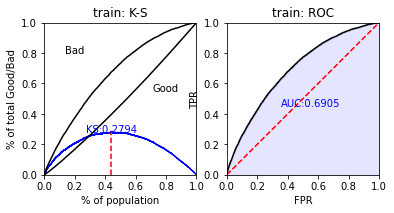

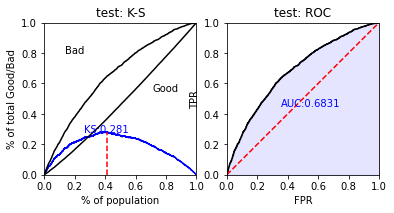

In [59]:
train_pred = grid_lr.predict_proba(X_train)[:,1]
test_pred = grid_lr.predict_proba(midval_X_test)[:,1]
train_perf = sc.perf_eva(y_train, train_pred, title = "train")
test_perf = sc.perf_eva(midval_y_test, test_pred, title = "test")

Узнаем про параметры:

In [60]:
print(grid_lr.best_params_)

{'C': 1.0, 'penalty': 'l2', 'solver': 'lbfgs'}


Проделаем аналогичные действия, но теперь будем использовать Randomized Search, чтобы сравнить результаты

In [61]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import StratifiedKFold

params = {'C' : np.logspace(start = -3, stop = 0, num = 10),
          'penalty' : ['l1', 'l2', 'elasticnet'],
          'solver': ['liblinear', 'saga', 'lbfgs']}

skf = StratifiedKFold(n_splits=10)

lr = LogisticRegression(random_state = 42)
random_lr = RandomizedSearchCV(lr, params, cv = skf, scoring='roc_auc', random_state = 42)
random_lr.fit(X_train, y_train)

preds = random_lr.predict_proba(midval_X_test)
print("Значение ROC AUC test: ", roc_auc_score(midval_y_test, preds[:, 1]))
print("Коэффициент Джини test:", roc_auc_score(midval_y_test, preds[:, 1]) * 2 - 1)

Значение ROC AUC test:  0.6834394311960102
Коэффициент Джини test: 0.3668788623920205


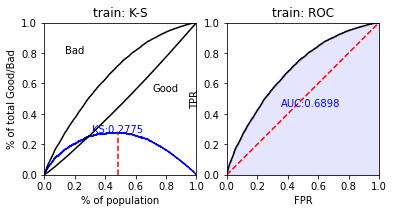

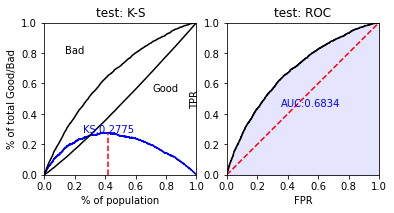

In [62]:
train_pred = random_lr.predict_proba(X_train)[:,1]
test_pred = random_lr.predict_proba(midval_X_test)[:,1]

train_perf = sc.perf_eva(y_train, train_pred, title = "train")
test_perf = sc.perf_eva(midval_y_test, test_pred, title = "test")

In [63]:
print(random_lr.best_params_)

{'solver': 'saga', 'penalty': 'l1', 'C': 0.1}


Видим, что оптимальные параметры сильно изменились, однако значения ROC AUC и коэффициента упали незначительно

Теперь попробуем выбрать трешхолд, чтобы учитывать такую метрику как полнота, так как нам лучше не выдать кредит надежному заемщику, чем выдать кредит ненадежному. Будем использовать оптимальные параметры, найденные при помощи GridSearchCV

In [64]:
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score
preds = grid_lr.predict_proba(midval_X_test)
precision = []
recall = []
accuracy = []
f1 = []
x = [1 * i / 100 for i in range(51)]
for i in range(51):
    threshold = 1 * i / 100
    preds_change = ((preds[:, 1]) > threshold).astype(int)
    precision.append(precision_score(midval_y_test, preds_change))
    recall.append(recall_score(midval_y_test, preds_change))
    accuracy.append(accuracy_score(midval_y_test, preds_change))
    f1.append(f1_score(midval_y_test, preds_change))
    
precision = pd.DataFrame({'threshold' : x, 'score' : precision})
precision['metric'] = 'precision'
recall = pd.DataFrame({'threshold' : x, 'score' : recall})
recall['metric'] = 'recall'
accuracy = pd.DataFrame({'threshold' : x, 'score' : accuracy})
accuracy['metric'] = 'accuracy'
f1 = pd.DataFrame({'threshold' : x, 'score' : f1})
f1['metric'] = 'f1'

df = pd.concat([precision, recall, accuracy, f1])
fig = px.line(df, x='threshold', y='score', color='metric', markers=True)
fig.update_layout(title='Choosing threshold')
fig.show()

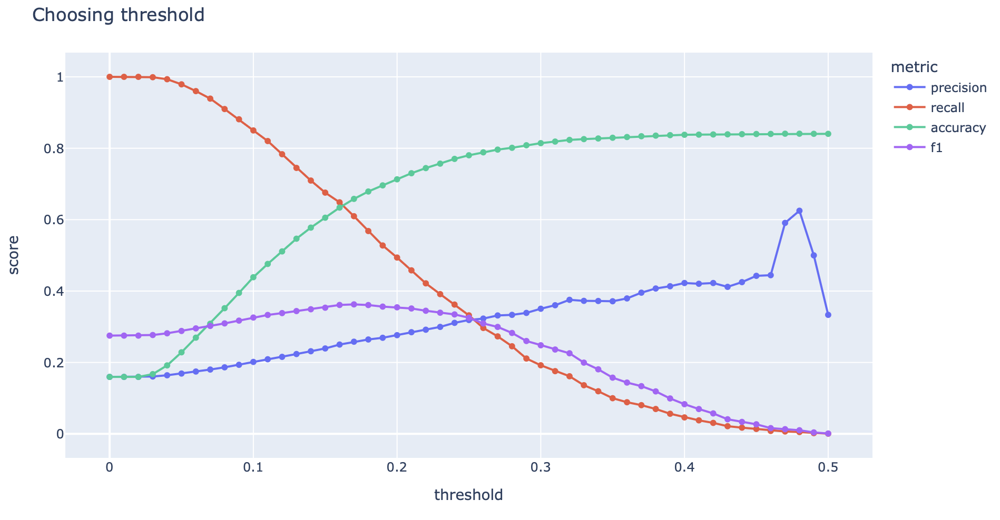

In [65]:
lr_woe = LogisticRegression(C = 1, penalty = 'l2', solver = 'lbfgs', random_state = 42)
lr_woe.fit(X_train, y_train)
lr_preds = lr_woe.predict_proba(midval_X_test)
print("Значение ROC AUC: ", roc_auc_score(midval_y_test, (lr_preds[:, 1] >= 0.16).astype(int)))
print("Коэффициент Джини:", roc_auc_score(midval_y_test, (lr_preds[:, 1] >= 0.16).astype(int)) * 2 - 1)

Значение ROC AUC:  0.6397369786767262
Коэффициент Джини: 0.2794739573534524


Коэффициенты полученной логистической регрессии выглядят следующим образом:

In [66]:
for i in range(len(X_train.columns)):
    print(X_train.columns[i], lr_woe.coef_[0][i], '\n')
print('intercept', lr_woe.intercept_[0])

purpose_woe -0.4267323684941585 

tot_hi_cred_lim_woe 0.11518446562734101 

avg_balance_to_funded_amnt_woe -0.24106106450701734 

addr_state_woe -0.8453224988542937 

term_woe -0.5291103756193591 

delinq_2yrs_woe -0.3012260076692933 

avg_cur_bal_woe -0.28891180347702505 

funded_amnt_woe 0.10690194775746956 

inq_last_6mths_woe -0.6548725652384455 

grade_woe -0.7223041861813211 

emp_title_length_woe -0.7335498944317576 

employment_known_woe -0.37851325760254234 

loan_to_income_woe -0.27655934255773224 

home_ownership_woe -0.5708349042312781 

dti_woe -0.45582665311725257 

mth_inc_to_payment_woe -0.36892703520498826 

annual_inc_woe -0.6742788421101484 

num_accts_ever_120_pd_woe -0.4850181380413911 

intercept -1.663483499675974


Теперь обратимся к настоящей тестовой выборке

In [67]:
X_test = test_newwoe.drop(columns = 'def')
y_test = test_newwoe['def']
X_test = X_test.drop(columns = ['funded_amnt', 'installment', 'term', 'issue_year', 'issue_month'])

new_lr_preds = lr_woe.predict_proba(X_test)
print("Значение ROC AUC test: ", roc_auc_score(y_test, new_lr_preds[:, 1]))
print("Коэффициент Джини test:", roc_auc_score(y_test, new_lr_preds[:, 1]) * 2 - 1)

Значение ROC AUC test:  0.6781247143649256
Коэффициент Джини test: 0.3562494287298512


Построим скоринговую карту и график соотношения скоринговых баллов и вероятности дефолта

In [68]:
card = sc.scorecard(bins_adj, lr_woe, X_train.columns)
visualized_card = pd.concat(card)
pd.set_option('display.max_rows', len(visualized_card))
visualized_card

variable  \
basepoints                 0                   basepoints   
purpose                    39                     purpose   
                           40                     purpose   
                           41                     purpose   
                           42                     purpose   
tot_hi_cred_lim            0              tot_hi_cred_lim   
                           1              tot_hi_cred_lim   
                           2              tot_hi_cred_lim   
                           3              tot_hi_cred_lim   
avg_balance_to_funded_amnt 43  avg_balance_to_funded_amnt   
                           44  avg_balance_to_funded_amnt   
                           45  avg_balance_to_funded_amnt   
addr_state                 46                  addr_state   
                           47                  addr_state   
                           48                  addr_state   
                           49                  addr_state   
                           50                  addr_state   
term                       9                         term   
                           10                        term   
delinq_2yrs                11                 delinq_2yrs   
                           12                 delinq_2yrs   
avg_cur_bal                51                 avg_cur_bal   
                           52                 avg_cur_bal   
                           53                 avg_cur_bal   
                           54                 avg_cur_bal   
funded_amnt                13                 funded_amnt   
                           14                 funded_amnt   
                           15                 funded_amnt   
                           16                 funded_amnt   
                           17                 funded_amnt   
inq_last_6mths             18              inq_last_6mths   
                           19              inq_last_6mths   
                           20              inq_last_6mths   
                           21              inq_last_6mths   
grade                      4                        grade   
                           5                        grade   
                           6                        grade   
                           7                        grade   
                           8                        grade   
emp_title_length           55            emp_title_length   
                           56            emp_title_length   
                           57            emp_title_length   
                           58            emp_title_length   
employment_known           22            employment_known   
                           23            employment_known   
loan_to_income             59              loan_to_income   
                           60              loan_to_income   
                           61              loan_to_income   
                           62              loan_to_income   
home_ownership             63              home_ownership   
                           64              home_ownership   
                           65              home_ownership   
dti                        24                         dti   
                           25                         dti   
                           26                         dti   
                           27                         dti   
                           28                         dti   
mth_inc_to_payment         29          mth_inc_to_payment   
                           30          mth_inc_to_payment   
                           31          mth_inc_to_payment   
                           32          mth_inc_to_payment   
annual_inc                 33                  annual_inc   
                           34                  annual_inc   
                           35                  annual_inc   
                           36                  annual_inc   
num_accts_ever_120_pd  

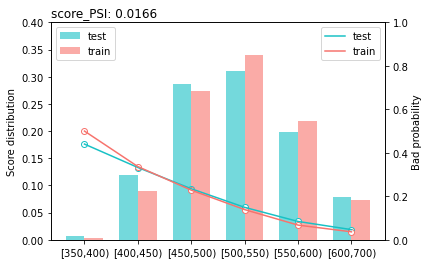

{'psi':   variable       PSI
 0    score  0.016556,
 'pic': {'score': <Figure size 432x288 with 2 Axes>}}

In [69]:
pd.reset_option('display.max_rows')
trainscore = sc.scorecard_ply(tr.loc['train'], card, print_step=0)
testscore = sc.scorecard_ply(tr.loc['test'], card, print_step=0)
sc.perf_psi(score = {'train' : trainscore, 'test' : testscore}, label = {'train' : tr_newwoe['def'], 'test' : test_newwoe['def']})

# Расчет ожидаемой прибыли от кредитования

Попробуем подобрать трешхолд, руководствуясь результатами расчета ожидаемой прибыли от кредитования:

In [70]:
best_profit = -1e9
best_threshold = -1
midval_X_test['funded_amnt'] = funded_amnt
midval_X_test['installment'] = installment
midval_X_test['term'] = term
midval_X_test['def'] = midval_y_test

thresholds = [i for i in range(1, 100)]
profits = []

for i in range(1, 100):
    threshold = i / 100
    midval_X_test['preds'] = (lr_preds[:, 1] >= threshold).astype(int)
    
    # дали, кому надо
    # 3 года
    midval_X_test.loc[midval_X_test[(midval_X_test['def'] == midval_X_test['preds']) & (midval_X_test['def'] == 0) & (midval_X_test['term'] == 36)].index, 'profit'] = 0.13 * (3 * midval_X_test['funded_amnt'] - (12 + 2 * 12) * midval_X_test['installment'])
    # 5 лет
    midval_X_test.loc[midval_X_test[(midval_X_test['def'] == midval_X_test['preds']) & (midval_X_test['def'] == 0) & (midval_X_test['term'] == 60)].index, 'profit'] = 0.13 * (5 * midval_X_test['funded_amnt'] - (12 + 2 * 12 + 3 * 12 + 4 * 12) * midval_X_test['installment'])
    
    # не дали, кому не надо
    midval_X_test.loc[midval_X_test[(midval_X_test['def'] == midval_X_test['preds']) & (midval_X_test['def'] == 1)].index, 'profit'] = 0
    
    # дали, кому не надо -> потеряли funded_amnt
    midval_X_test.loc[midval_X_test[(midval_X_test['def'] != midval_X_test['preds']) & (midval_X_test['def'] == 1)].index, 'profit'] = -1 * midval_X_test['funded_amnt']
    
    # не дали, а можно было бы: потеряли ожидаемую прибыль
    midval_X_test.loc[midval_X_test[(midval_X_test['def'] != midval_X_test['preds']) & (midval_X_test['def'] == 0) & (midval_X_test['term'] == 36)].index, 'profit'] = -0.13 * (3 * midval_X_test['funded_amnt'] - (12 + 2 * 12) * midval_X_test['installment'])
    midval_X_test.loc[midval_X_test[(midval_X_test['def'] != midval_X_test['preds']) & (midval_X_test['def'] == 0) & (midval_X_test['term'] == 60)].index, 'profit'] = -0.13 * (5 * midval_X_test['funded_amnt'] - (12 + 2 * 12 + 3 * 12 + 4 * 12) * midval_X_test['installment'])
    
    profit = midval_X_test['profit'].sum()
    profits.append(profit)
    
    if profit > best_profit:
        best_profit = profit
        best_threshold = threshold

profits = pd.DataFrame({'threshold' : thresholds, 'profit' : profits})
fig = px.line(profits, x='threshold', y='profit', markers=True)
fig.update_layout(title = "Profit values for different thresholds. LGD = 1")
fig.show()
print("Лучший порог отсечения:", best_threshold)
print("Макс.ожидаемая прибыль:", best_profit)

Лучший порог отсечения: 0.32
Макс.ожидаемая прибыль: 6685696.603600001


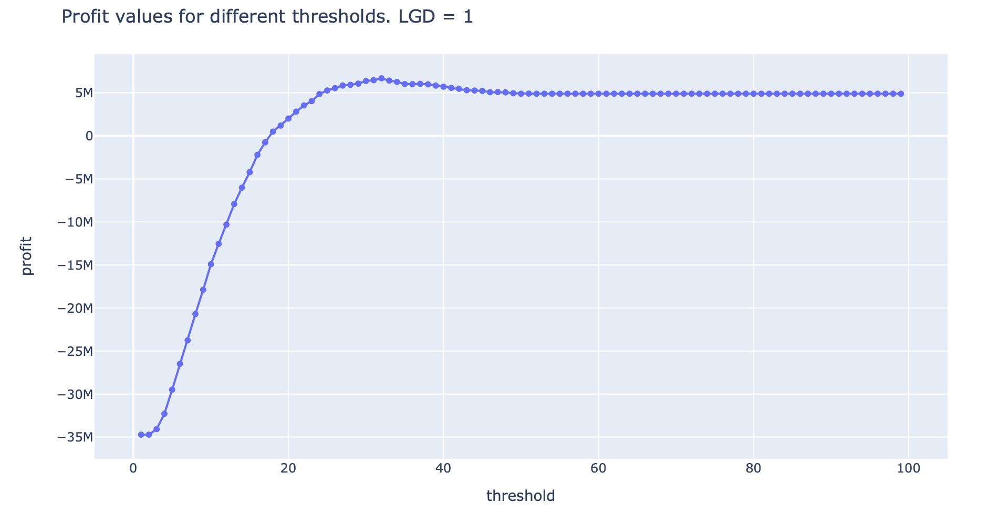

Мы подобрали оптимальный трешхолд для выдачи кредита при расчете ожидаемой прибыли от кредитования, если при дефолте клиента мы теряем всю сумму funded_amnt. Видим, что на самом деле нет нужды так сильно сокращать трешхолд и добиваться высокого значения recall, если наша цель – максимизировать прибыль

Теперь посчитаем прибыль при этом пороге отсечения для настоящей тестовой выборки:

In [71]:
X_test = test_newwoe.drop(columns = 'def')
y_test = test_newwoe['def']

funded_amnt_test = X_test['funded_amnt']
installment_test = X_test['installment']
term_test = X_test['term']

X_test = X_test.drop(columns = ['funded_amnt', 'installment', 'term', 'issue_year', 'issue_month'])
new_lr_preds = lr_woe.predict_proba(X_test)

X_test['funded_amnt'] = funded_amnt_test
X_test['installment'] = installment_test
X_test['term'] = term_test
X_test['def'] = y_test

threshold = 0.32

X_test['preds'] = (new_lr_preds[:, 1] >= threshold).astype(int)
    
# дали, кому надо
# 3 года
X_test.loc[X_test[(X_test['def'] == X_test['preds']) & (X_test['def'] == 0) & (X_test['term'] == 36)].index, 'profit'] = 0.13 * (3 * X_test['funded_amnt'] - (12 + 2 * 12) * X_test['installment'])
# 5 лет
X_test.loc[X_test[(X_test['def'] == X_test['preds']) & (X_test['def'] == 0) & (X_test['term'] == 60)].index, 'profit'] = 0.13 * (5 * X_test['funded_amnt'] - (12 + 2 * 12 + 3 * 12 + 4 * 12) * X_test['installment'])
    
# не дали, кому не надо
X_test.loc[X_test[(X_test['def'] == X_test['preds']) & (X_test['def'] == 1)].index, 'profit'] = 0
    
# дали, кому не надо -> потеряли funded_amnt
X_test.loc[X_test[(X_test['def'] != X_test['preds']) & (X_test['def'] == 1)].index, 'profit'] = -1 * X_test['funded_amnt']
    
# не дали, а можно было бы: потеряли ожидаемую прибыль
X_test.loc[X_test[(X_test['def'] != X_test['preds']) & (X_test['def'] == 0) & (X_test['term'] == 36)].index, 'profit'] = -0.13 * (3 * X_test['funded_amnt'] - (12 + 2 * 12) * X_test['installment'])
X_test.loc[X_test[(X_test['def'] != X_test['preds']) & (X_test['def'] == 0) & (X_test['term'] == 60)].index, 'profit'] = -0.13 * (5 * X_test['funded_amnt'] - (12 + 2 * 12 + 3 * 12 + 4 * 12) * X_test['installment'])
    
profit = X_test['profit'].sum()
print("Текущий порог отсечения:", threshold)
print("Ожидаемая прибыль:", profit)

Текущий порог отсечения: 0.32
Ожидаемая прибыль: 27117316.008


Если же мы будем терять лишь 80% от выданной суммы:

In [72]:
best_profit = -1e9
best_threshold = -1
midval_X_test['funded_amnt'] = funded_amnt
midval_X_test['installment'] = installment
midval_X_test['term'] = term
midval_X_test['def'] = midval_y_test

thresholds = [i for i in range(1, 100)]
profits = []

for i in range(1, 100):
    threshold = i / 100
    midval_X_test['preds'] = (lr_preds[:, 1] >= threshold).astype(int)
    
    # дали, кому надо
    # 3 года
    midval_X_test.loc[midval_X_test[(midval_X_test['def'] == midval_X_test['preds']) & (midval_X_test['def'] == 0) & (midval_X_test['term'] == 36)].index, 'profit'] = 0.13 * (3 * midval_X_test['funded_amnt'] - (12 + 2 * 12) * midval_X_test['installment'])
    # 5 лет
    midval_X_test.loc[midval_X_test[(midval_X_test['def'] == midval_X_test['preds']) & (midval_X_test['def'] == 0) & (midval_X_test['term'] == 60)].index, 'profit'] = 0.13 * (5 * midval_X_test['funded_amnt'] - (12 + 2 * 12 + 3 * 12 + 4 * 12) * midval_X_test['installment'])
    
    # не дали, кому не надо
    midval_X_test.loc[midval_X_test[(midval_X_test['def'] == midval_X_test['preds']) & (midval_X_test['def'] == 1)].index, 'profit'] = 0
    
    # дали, кому не надо -> потеряли funded_amnt
    midval_X_test.loc[midval_X_test[(midval_X_test['def'] != midval_X_test['preds']) & (midval_X_test['def'] == 1)].index, 'profit'] = -0.8 * midval_X_test['funded_amnt']
    
    # не дали, а можно было бы: потеряли ожидаемую прибыль
    midval_X_test.loc[midval_X_test[(midval_X_test['def'] != midval_X_test['preds']) & (midval_X_test['def'] == 0) & (midval_X_test['term'] == 36)].index, 'profit'] = -0.13 * (3 * midval_X_test['funded_amnt'] - (12 + 2 * 12) * midval_X_test['installment'])
    midval_X_test.loc[midval_X_test[(midval_X_test['def'] != midval_X_test['preds']) & (midval_X_test['def'] == 0) & (midval_X_test['term'] == 60)].index, 'profit'] = -0.13 * (5 * midval_X_test['funded_amnt'] - (12 + 2 * 12 + 3 * 12 + 4 * 12) * midval_X_test['installment'])
    
    profit = midval_X_test['profit'].sum()
    profits.append(profit)
    
    if profit > best_profit:
        best_profit = profit
        best_threshold = threshold

profits = pd.DataFrame({'threshold' : thresholds, 'profit' : profits})
fig = px.line(profits, x='threshold', y='profit', markers=True)
fig.update_layout(title = "Profit values for different thresholds. LGD = 0.8")
fig.show()
print("Лучший порог отсечения:", best_threshold)
print("Макс.ожидаемая прибыль:", best_profit)

Лучший порог отсечения: 0.38
Макс.ожидаемая прибыль: 11401309.994800001


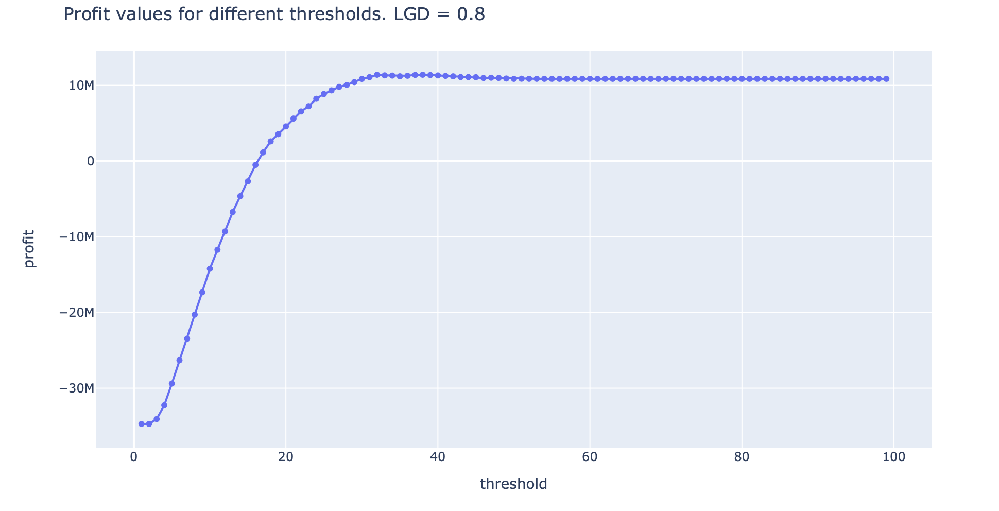

Видим, что порог отсечения поменялся в большую сторону (что логично, так как теперь выдача кредита менее надежному заемщику несет меньшие убытки, ведь LGD = 0.8). Увеличилась и прибыль

Теперь снова спрогнозируем ожидаемую прибыль на тестовых данных с использованием полученного трешхолда

In [73]:
X_test = test_newwoe.drop(columns = 'def')
y_test = test_newwoe['def']

funded_amnt_test = X_test['funded_amnt']
installment_test = X_test['installment']
term_test = X_test['term']

X_test = X_test.drop(columns = ['funded_amnt', 'installment', 'term', 'issue_year', 'issue_month'])
new_lr_preds = lr_woe.predict_proba(X_test)

X_test['funded_amnt'] = funded_amnt_test
X_test['installment'] = installment_test
X_test['term'] = term_test
X_test['def'] = y_test

threshold = 0.38

X_test['preds'] = (new_lr_preds[:, 1] >= threshold).astype(int)
    
# дали, кому надо
# 3 года
X_test.loc[X_test[(X_test['def'] == X_test['preds']) & (X_test['def'] == 0) & (X_test['term'] == 36)].index, 'profit'] = 0.13 * (3 * X_test['funded_amnt'] - (12 + 2 * 12) * X_test['installment'])
# 5 лет
X_test.loc[X_test[(X_test['def'] == X_test['preds']) & (X_test['def'] == 0) & (X_test['term'] == 60)].index, 'profit'] = 0.13 * (5 * X_test['funded_amnt'] - (12 + 2 * 12 + 3 * 12 + 4 * 12) * X_test['installment'])
    
# не дали, кому не надо
X_test.loc[X_test[(X_test['def'] == X_test['preds']) & (X_test['def'] == 1)].index, 'profit'] = 0
    
# дали, кому не надо -> потеряли funded_amnt
X_test.loc[X_test[(X_test['def'] != X_test['preds']) & (X_test['def'] == 1)].index, 'profit'] = -0.8 * X_test['funded_amnt']
    
# не дали, а можно было бы: потеряли ожидаемую прибыль
X_test.loc[X_test[(X_test['def'] != X_test['preds']) & (X_test['def'] == 0) & (X_test['term'] == 36)].index, 'profit'] = -0.13 * (3 * X_test['funded_amnt'] - (12 + 2 * 12) * X_test['installment'])
X_test.loc[X_test[(X_test['def'] != X_test['preds']) & (X_test['def'] == 0) & (X_test['term'] == 60)].index, 'profit'] = -0.13 * (5 * X_test['funded_amnt'] - (12 + 2 * 12 + 3 * 12 + 4 * 12) * X_test['installment'])
    
profit = X_test['profit'].sum()
print("Текущий порог отсечения:", threshold)
print("Ожидаемая прибыль:", profit)

Текущий порог отсечения: 0.38
Ожидаемая прибыль: 55902486.7528


# Обучение других моделей

Теперь посмотрим на результаты других моделей: обычной логистической регрессии со стандартизованными признаками, градиентного бустинга и ансамбля, объединяющего в себе результаты градиентного бустинга и логистической регрессии с WOE-преобразованиями.

In [74]:
tr_base = pd.get_dummies(tr, columns=['purpose', 'addr_state', 'grade', 'home_ownership', 'term'], drop_first = True)

In [75]:
tr_base = tr_base.drop(columns=['issue_month', 'issue_year', 'installment'])

In [76]:
from sklearn.model_selection import train_test_split
tr_new = tr_base.loc['train']
test_new = tr_base.loc['test']
X_train, midval_X_test, y_train, midval_y_test = train_test_split(tr_new.drop(columns = 'def'), tr_new['def'], test_size = 0.2, random_state = 42, stratify = tr_new['def'])
tr_new = pd.concat([X_train, y_train], axis=1)
midval_new = pd.concat([midval_X_test, midval_y_test], axis=1)

X_train = tr_new.drop(columns = 'def')
y_train = tr_new['def']
midval_X_test = midval_new.drop(columns = 'def')
midval_y_test = midval_new['def']
X_test = test_new.drop(columns = 'def')
y_test = test_new['def']

Не забудем стандартизировать наши признаки

In [77]:
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()
ss.fit(X_train)
X_train = pd.DataFrame(ss.transform(X_train), columns = X_train.columns)
ss.fit(midval_X_test)
midval_X_test = pd.DataFrame(ss.transform(midval_X_test), columns = midval_X_test.columns)
ss.fit(X_test)
X_test = pd.DataFrame(ss.transform(X_test), columns = X_test.columns)

Оценка ROC AUC через predict_proba...

In [78]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
lr = LogisticRegression(random_state = 42)
lr.fit(X_train, y_train)
preds1 = lr.predict_proba(midval_X_test)
preds2 = lr.predict_proba(X_test)
print(roc_auc_score(midval_y_test, preds1[:, 1]))
print(roc_auc_score(y_test, preds2[:, 1]))

0.6864593165359805
0.6842030457381845


Теперь подготовим данные для градиентного бустинга

In [79]:
tr_base = pd.get_dummies(tr, columns=['purpose', 'addr_state', 'grade', 'home_ownership', 'term'])
tr_base = tr_base.drop(columns=['installment'])
from sklearn.model_selection import train_test_split
tr_new = tr_base.loc['train']
test_new = tr_base.loc['test']
X_train, midval_X_test, y_train, midval_y_test = train_test_split(tr_new.drop(columns = 'def'), tr_new['def'], test_size = 0.2, random_state = 42, stratify = tr_new['def'])
tr_new = pd.concat([X_train, y_train], axis=1)
midval_new = pd.concat([midval_X_test, midval_y_test], axis=1)

X_train = tr_new.drop(columns = 'def')
y_train = tr_new['def']
midval_X_test = midval_new.drop(columns = 'def')
midval_y_test = midval_new['def']
X_test = test_new.drop(columns = 'def')
y_test = test_new['def']

Посмотрим на результаты градиентного бустинга

In [80]:
import xgboost as xgb
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import RandomizedSearchCV

params = {'learning_rate': [i / 100 for i in range(5, 31, 5)],
            'max_depth': [2, 3, 4, 5],
            'min_child_weight': [10,15,20,25],
            'colsample_bytree': [0.5, 0.6, 0.7, 0.8],
            'n_estimators': [50, 100, 150, 200, 250, 300],
            "reg_alpha"   : [0.5,0.75,1],
            "reg_lambda"  : [2,3,5]}

xgbc = xgb.XGBClassifier(random_state = 42)
skf = StratifiedKFold(n_splits=10)
grid_obj_xgbc = RandomizedSearchCV(xgbc, params, cv=skf, n_iter=10, scoring='roc_auc', n_jobs=12, random_state = 42)
grid_obj_xgbc.fit(X_train, y_train)

preds = grid_obj_xgbc.predict_proba(X_train)
boost_preds = grid_obj_xgbc.predict_proba(midval_X_test)
boost_preds2 = grid_obj_xgbc.predict_proba(X_test)
print(roc_auc_score(y_train, preds[:, 1]))
print(roc_auc_score(midval_y_test, boost_preds[:, 1]))
print(roc_auc_score(y_test, boost_preds2[:, 1]))

0.7109060241526528
0.6888528087840918
0.6845814514971654


Здесь стоит также отметить, что мы проводим "предварительное" тестирование на валидационной выборке по большей части для того, чтобы можно было сравнить показатели во время проведения валидационных тестов. Если бы мы использовали для обучения тренировочную и валидационную выборку, результаты были бы выше, поскольку было бы больше данных для обучения

In [81]:
print(grid_obj_xgbc.best_params_)

{'reg_lambda': 3, 'reg_alpha': 1, 'n_estimators': 300, 'min_child_weight': 10, 'max_depth': 2, 'learning_rate': 0.1, 'colsample_bytree': 0.7}


In [82]:
params = {'learning_rate': [0.1],
            'max_depth': [2],
            'min_child_weight': [10],
            'colsample_bytree': [0.7],
            'n_estimators': [300],
            "reg_alpha"   : [1],
            "reg_lambda"  : [3]}

xgbc = xgb.XGBClassifier(random_state = 42)
skf = StratifiedKFold(n_splits=10)
grid_obj_xgbc = RandomizedSearchCV(xgbc, params, cv=skf, n_iter=10, scoring='roc_auc', n_jobs=12, random_state = 42)
grid_obj_xgbc.fit(X_train, y_train)

RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, grow_policy=None,
                                           impo...
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints=None,
                                           multi_strategy=None,
                                           n_estimators=None, n_jobs=None,
                                           num_parallel_tree=None,
                                           random_state=42, ...),
                   n_jobs=12,
                   param_distributions={'colsample_bytree': [0.7],
                                        'learning_rate': [0.1],
                                        'max_depth': [2],
                                        'min_child_weight': [10],
                                        'n_estimators': [300], 'reg_alpha': [1],
                                        'reg_lambda': [3]},
                   random_state=42, scoring='roc_auc')

Отлично, у нас получилось не переобучиться! Теперь попробуем построить кастомный ансамбль (тут уже без валидационной части выборки, поскольку этот ансамбль мы не будем отправлять на валидацию, а подбор гиперпараметров уже был произведен)

In [83]:
tr_new = tr_base.loc['train']
test_new = tr_base.loc['test']
X_train = tr_new.drop(columns = 'def')
y_train = tr_new['def']
X_test = test_new.drop(columns = 'def')
y_test = test_new['def']
trmidval_newwoe = pd.concat([tr_newwoe, midval_newwoe])

In [84]:
from sklearn.ensemble import StackingClassifier
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

woe_cols = tr_newwoe.drop(columns = ['def', 'funded_amnt', 'installment', 'term', 'issue_month', 'issue_year']).columns
pipe_woe = Pipeline([('select', ColumnTransformer([('woe', 'passthrough', woe_cols)], remainder='drop')), ('woe_lr', lr_woe)])

boosting_cols = X_train.columns
pipe_boosting = Pipeline([('select', ColumnTransformer([('boost', 'passthrough', boosting_cols)], remainder='drop')), ('gb', grid_obj_xgbc)])

X_train = pd.concat([X_train, trmidval_newwoe.drop(columns = ['def', 'funded_amnt', 'installment', 'term', 'issue_month', 'issue_year'])], axis=1)
X_test = pd.concat([X_test, test_newwoe.drop(columns = ['def', 'funded_amnt', 'installment', 'term', 'issue_month', 'issue_year'])], axis=1)

stacking_model = StackingClassifier(estimators = [('woe_lr', pipe_woe), ('gb', pipe_boosting)], cv = skf)
stacking_model.fit(X_train, y_train)
preds = stacking_model.predict_proba(X_test)
print(roc_auc_score(y_test, preds[:, 1]))

0.6830177511631159


Все-таки даже так результат почти не изменился по сравнению с woe-регрессией и градиентным бустингом

# Валидационные тесты

Теперь проведем валидационные тесты на двух моделях: woe-регрессии, которая была основным заданием, а также градиентном бустинге

### Эффективность ранжирования всей модели

In [85]:
from sklearn.metrics import roc_curve, auc

def rocauc_gini(y_test, preds):
    
    print("Значение ROC AUC: ", roc_auc_score(y_test, preds[:, 1]))
    print("Коэффициент Джини:", roc_auc_score(y_test, preds[:, 1]) * 2 - 1)
    
    fpr, tpr, thresholds = roc_curve(y_test, preds[:, 1])

    fig = px.area(
        x=fpr, y=tpr,
        title=f'ROC Curve (AUC={auc(fpr, tpr):.4f})',
        labels=dict(x='False Positive Rate', y='True Positive Rate'),
        width=500, height=500, color_discrete_sequence = ['#9467BD']
    )
    fig.add_shape(
        type='line', line=dict(dash='dash'),
        x0=0, x1=1, y0=0, y1=1
    )

    fig.update_yaxes(scaleanchor="x", scaleratio=1)
    fig.update_xaxes(constrain='domain')
    fig.update_traces(marker_color='#9467BD')
    fig.show()

In [86]:
rocauc_gini(y_test, new_lr_preds)

Значение ROC AUC:  0.6781247143649256
Коэффициент Джини: 0.3562494287298512


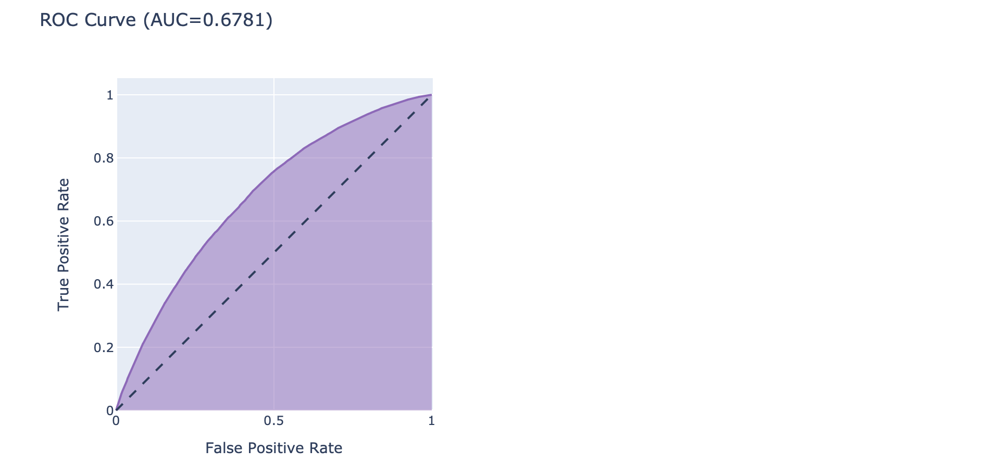

In [87]:
rocauc_gini(y_test, boost_preds2)

Значение ROC AUC:  0.6845814514971654
Коэффициент Джини: 0.36916290299433085


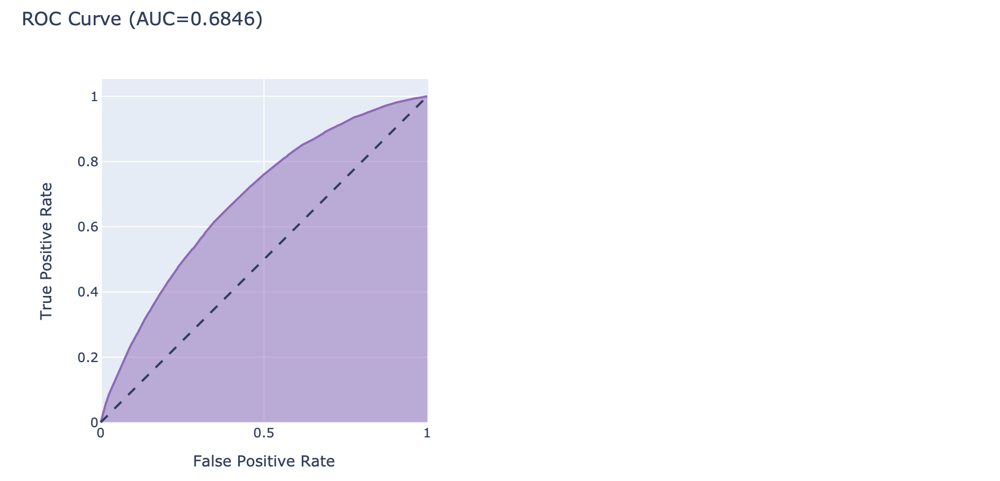

Светофор зеленый для обеих моделей

### Эффективность ранжирования всех факторов

In [88]:
def feature_gini(X_train, y_train, X_test, y_test, model):
    
    ginis = {'feature': [], 'gini': []}
    for x in X_train.columns:
        trainx = pd.DataFrame(X_train[x])
        testx = pd.DataFrame(X_test[x])
        
        model.fit(trainx, y_train)
        preds = model.predict_proba(testx)
        ginis['feature'].append(x)
        ginis['gini'].append(roc_auc_score(y_test, preds[:, 1]) * 2 - 1)
    
    df = pd.DataFrame(ginis)
    df = df.sort_values(by='gini', ascending=False)
    print('Red factors:   ', len(df[df['gini'] < 0]) / len(df))
    print('Yellow factors:', len(df[(df['gini'] <= 0.05) & (df['gini'] >= 0)]) / len(df))
    print('Green factors: ', len(df[df['gini'] > 0.05]) / len(df))
    
    fig = px.bar(df, x='feature', y='gini', title='Gini by features')
    fig.update_traces(marker_color='#9467BD')
    fig.show()

In [89]:
X_train = tr_newwoe.drop(columns = ['funded_amnt', 'installment', 'term', 'def', 'issue_year', 'issue_month'])
y_train = tr_newwoe['def']
X_test = test_newwoe.drop(columns = ['funded_amnt', 'installment', 'term', 'def', 'issue_year', 'issue_month'])
y_test = test_newwoe['def']
feature_gini(X_train, y_train, X_test, y_test, lr_woe)

Red factors:    0.0
Yellow factors: 0.2777777777777778
Green factors:  0.7222222222222222


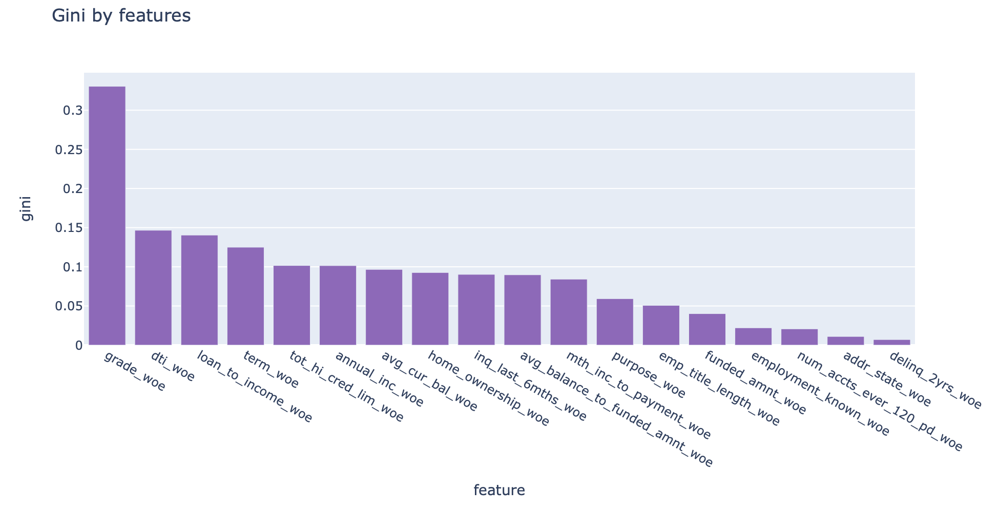

In [90]:
tr_new = tr_base.loc['train']
test_new = tr_base.loc['test']
X_train, midval_X_test, y_train, midval_y_test = train_test_split(tr_new.drop(columns = 'def'), tr_new['def'], test_size = 0.2, random_state = 42, stratify = tr_new['def'])
tr_new = pd.concat([X_train, y_train], axis=1)
X_train = tr_new.drop(columns = 'def')
y_train = tr_new['def']
X_test = test_new.drop(columns = 'def')
y_test = test_new['def']
feature_gini(X_train, y_train, X_test, y_test, grid_obj_xgbc)

Red factors:    0.14814814814814814
Yellow factors: 0.5
Green factors:  0.35185185185185186


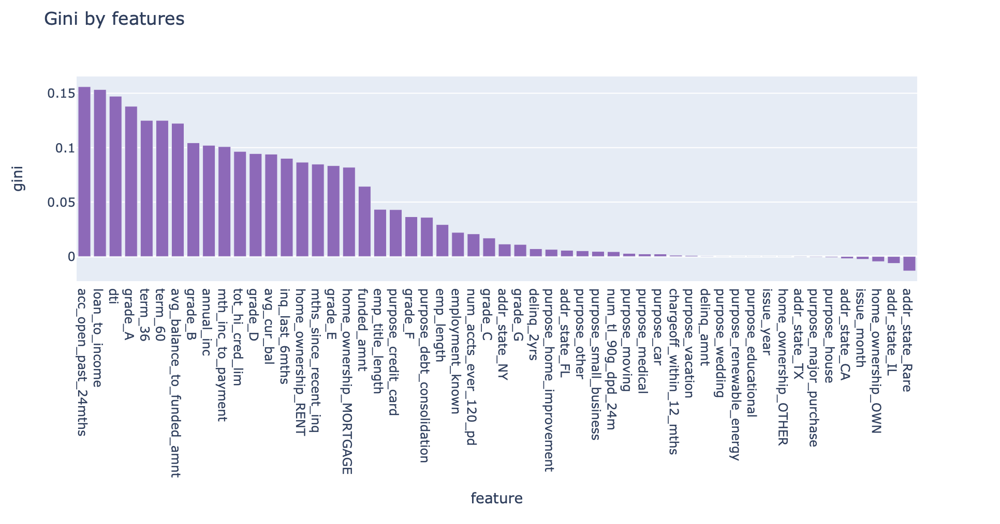

Итоговый светофор для теста: желтый для логистической регрессии с woe-преобразованием признаков; между желтым и красным для градиентного бустинга (присутствуют красные факторы, но их не более 20%)

### Анализ вкладов факторов в формирование Джини модели

In [91]:
def feature_contribution(X_train, y_train, X_test, y_test, model):
    
    ginis = {'feature': [], 'gini': []}
    for x in X_train.columns:
        trainx = pd.DataFrame(X_train[x])
        testx = pd.DataFrame(X_test[x])
        
        model.fit(trainx, y_train)
        preds = model.predict_proba(testx)
        ginis['feature'].append(x)
        ginis['gini'].append(roc_auc_score(y_test, preds[:, 1]) * 2 - 1)
    
    df = pd.DataFrame(ginis)
    df = df.sort_values(by='gini', ascending=False)
    
    new_ginis = {'feature': [], 'gini': []}
    used = []
    for x in df['feature']:
        used.append(x)
        trainx = pd.DataFrame(X_train[used])
        testx = pd.DataFrame(X_test[used])
        
        model.fit(trainx, y_train)
        preds = model.predict_proba(testx)
        new_ginis['feature'].append(x)
        new_ginis['gini'].append(roc_auc_score(y_test, preds[:, 1]) * 2 - 1)
    
    fig = px.bar(new_ginis, x='feature', y='gini', title='Feature contribution: how Gini changes')
    fig.update_traces(marker_color='#9467BD')
    fig.show()

In [92]:
X_train = tr_newwoe.drop(columns = ['funded_amnt', 'installment', 'term', 'def', 'issue_year', 'issue_month'])
y_train = tr_newwoe['def']
X_test = test_newwoe.drop(columns = ['funded_amnt', 'installment', 'term', 'def', 'issue_year', 'issue_month'])
y_test = test_newwoe['def']
feature_contribution(X_train, y_train, X_test, y_test, lr_woe)

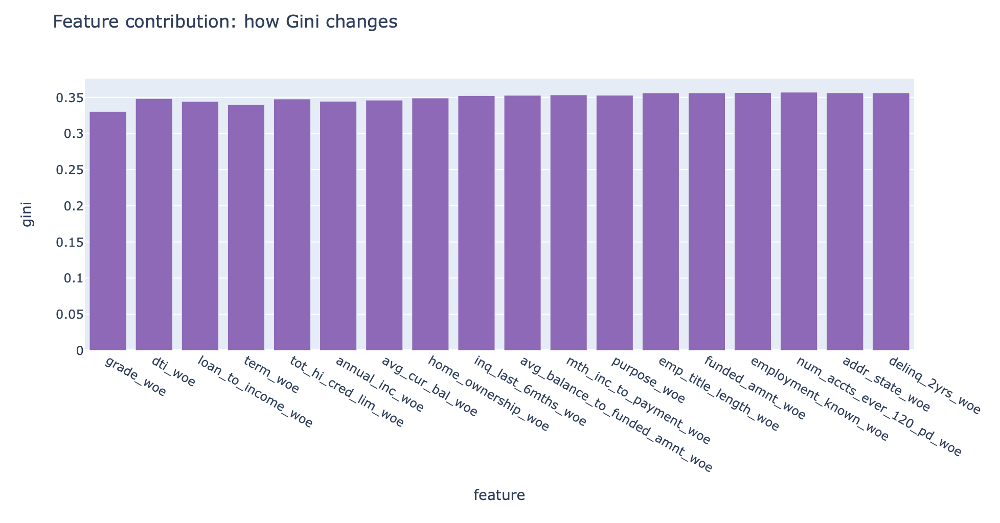

In [93]:
tr_new = tr_base.loc['train']
test_new = tr_base.loc['test']
X_train, midval_X_test, y_train, midval_y_test = train_test_split(tr_new.drop(columns = 'def'), tr_new['def'], test_size = 0.2, random_state = 42, stratify = tr_new['def'])
tr_new = pd.concat([X_train, y_train], axis=1)
X_train = tr_new.drop(columns = 'def')
y_train = tr_new['def']
X_test = test_new.drop(columns = 'def')
y_test = test_new['def']
feature_contribution(X_train, y_train, X_test, y_test, grid_obj_xgbc)

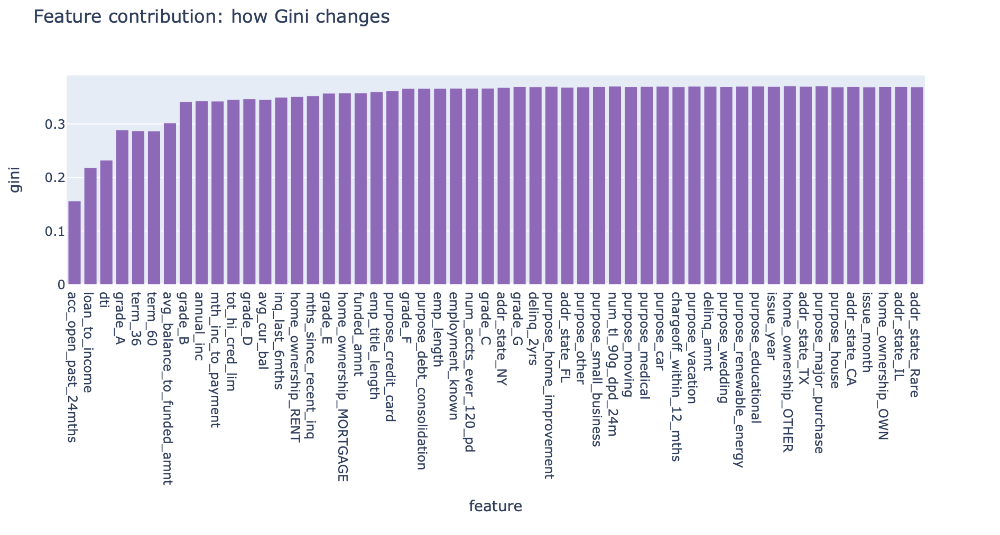

Информационный тест без светофора

### Динамика коэффициента Джини

In [94]:
def gini_dynamics_time(X_train, y_train, X_test, y_test, name_model, model):
    model.fit(X_train, y_train)
    test = pd.concat([X_test, y_test], axis=1)
    grouped = test.groupby(['issue_year', 'issue_month'])
    indices = grouped.indices
    ginis = {'time': [], 'gini': [], 'num_of_people': []}
    for x in indices:
        test = grouped.get_group(x)
        if name_model == 'lr':
            X_test = test.drop(columns=['def', 'issue_year', 'issue_month'])
        else:
            X_test = test.drop(columns=['def'])
        y_test = test['def']
        preds = model.predict_proba(X_test)
        ginis['time'].append(str(x[0]) + ', ' + str(x[1]))
        ginis['gini'].append(roc_auc_score(y_test, preds[:, 1]) * 2 - 1)
        ginis['num_of_people'].append(len(test))
    ginis = pd.DataFrame(ginis)
    
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=ginis['time'], y=ginis['gini'], customdata=ginis['num_of_people'], name='gini by month&year, test', hovertemplate="Year&Month: %{x}<br>" + "Gini: %{y:.4f}<br>" + "Num Of Observations (test): %{customdata}" + "<extra></extra>", mode='lines+markers', line_color='#9467BD', showlegend=True))
    fig.add_trace(go.Scatter(x=ginis['time'], y=[ginis['gini'].mean() for i in range(len(ginis['time']))], name='gini by month&year, mean', hovertemplate="Mean Gini<extra></extra>", mode='lines', line={'dash': 'dash', 'color': '#FECB52'}, showlegend=True))
    
    std = np.std(ginis['gini']) * 1.96 / (ginis['gini'] ** 0.5) #95%
    fig.add_trace(go.Scatter(x=ginis['time'], y=ginis['gini'] + std, hovertemplate="CI 95%<extra></extra>", line_color = 'rgba(148, 103, 189, 0)', showlegend = False))
    fig.add_trace(go.Scatter(x=ginis['time'], y=ginis['gini'] - std, hovertemplate="CI 95%<extra></extra>", line_color = 'rgba(148, 103, 189, 0)', name = '95% confidence interval', fill='tonexty', fillcolor = 'rgba(148, 103, 189, 0.2)'))
    
    fig.update_layout(title = 'Gini dynamics')
    fig.update_xaxes(title = 'Year&Month')
    fig.update_yaxes(title = 'Gini', range=[0, 1])
    fig.show()

In [95]:
X_train = tr_newwoe.drop(columns = ['funded_amnt', 'installment', 'term', 'def', 'issue_year', 'issue_month'])
y_train = tr_newwoe['def']
X_test = test_newwoe.drop(columns = ['funded_amnt', 'installment', 'term', 'def'])
y_test = test_newwoe['def']
gini_dynamics_time(X_train, y_train, X_test, y_test, 'lr', lr_woe)

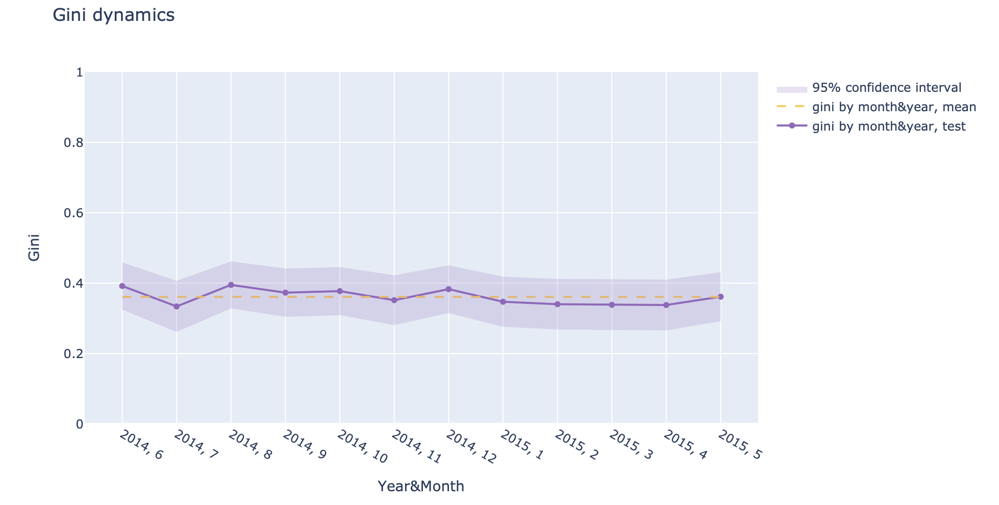

In [96]:
tr_new = tr_base.loc['train']
test_new = tr_base.loc['test']
X_train, midval_X_test, y_train, midval_y_test = train_test_split(tr_new.drop(columns = 'def'), tr_new['def'], test_size = 0.2, random_state = 42, stratify = tr_new['def'])
tr_new = pd.concat([X_train, y_train], axis=1)
X_train = tr_new.drop(columns = 'def')
y_train = tr_new['def']
X_test = test_new.drop(columns = 'def')
y_test = test_new['def']
gini_dynamics_time(X_train, y_train, X_test, y_test, 'xgb', grid_obj_xgbc)

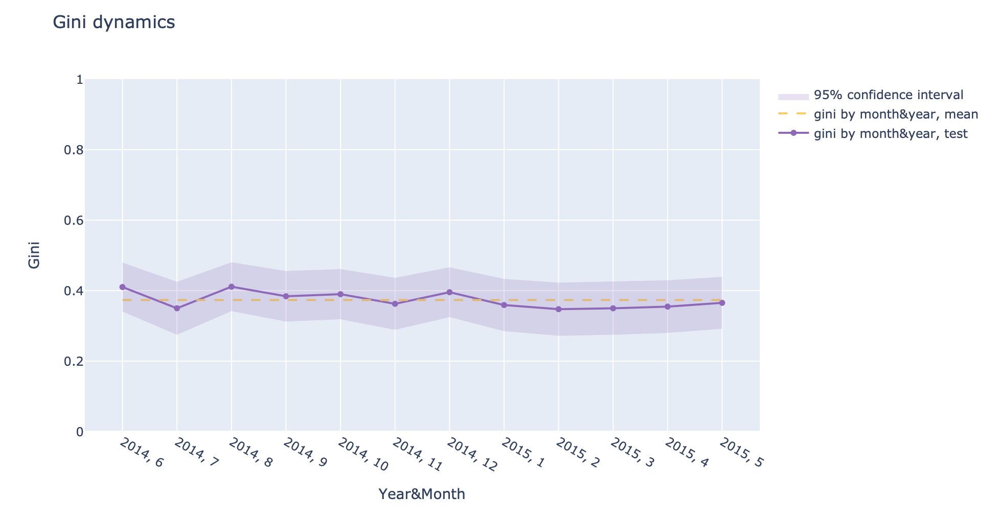

Информационный тест без светофора

### Анализ корректности дискретного преобразования факторов

Применимо только к woe-регрессии

{'tot_hi_cred_lim': <Figure size 432x288 with 2 Axes>,
 'grade': <Figure size 432x288 with 2 Axes>,
 'term': <Figure size 432x288 with 2 Axes>,
 'delinq_2yrs': <Figure size 432x288 with 2 Axes>,
 'funded_amnt': <Figure size 432x288 with 2 Axes>,
 'inq_last_6mths': <Figure size 432x288 with 2 Axes>,
 'employment_known': <Figure size 432x288 with 2 Axes>,
 'dti': <Figure size 432x288 with 2 Axes>,
 'mth_inc_to_payment': <Figure size 432x288 with 2 Axes>,
 'annual_inc': <Figure size 432x288 with 2 Axes>,
 'num_accts_ever_120_pd': <Figure size 432x288 with 2 Axes>,
 'purpose': <Figure size 432x288 with 2 Axes>,
 'avg_balance_to_funded_amnt': <Figure size 432x288 with 2 Axes>,
 'addr_state': <Figure size 432x288 with 2 Axes>,
 'avg_cur_bal': <Figure size 432x288 with 2 Axes>,
 'emp_title_length': <Figure size 432x288 with 2 Axes>,
 'loan_to_income': <Figure size 432x288 with 2 Axes>,
 'home_ownership': <Figure size 432x288 with 2 Axes>}

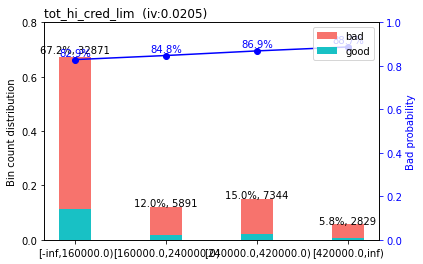

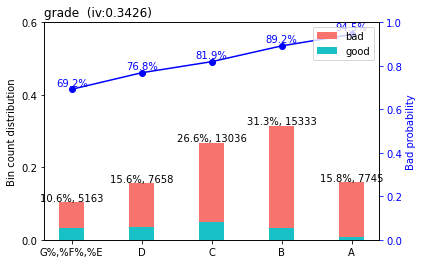

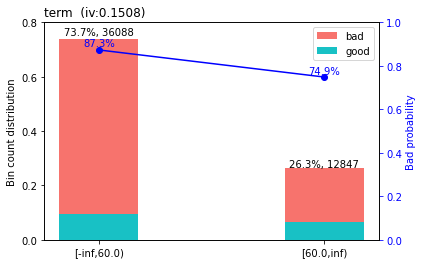

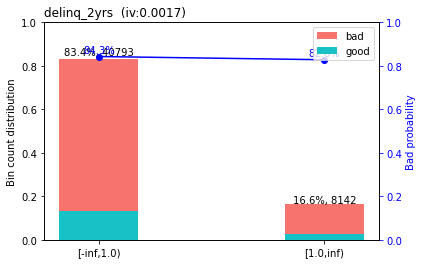

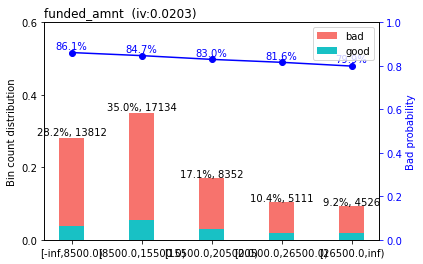

...

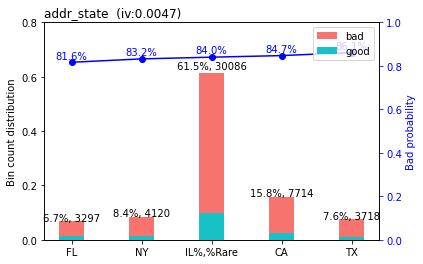

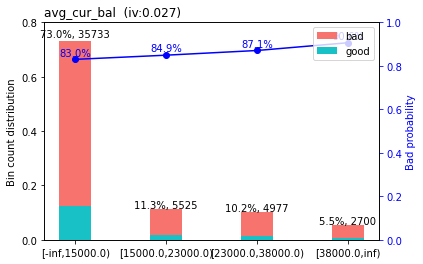

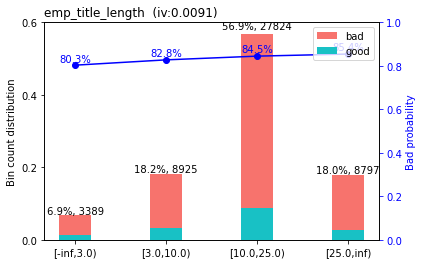

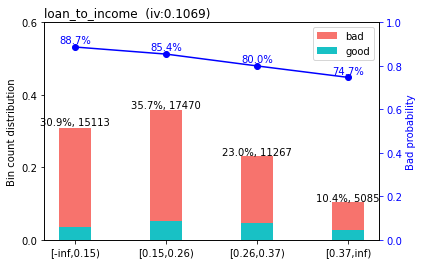

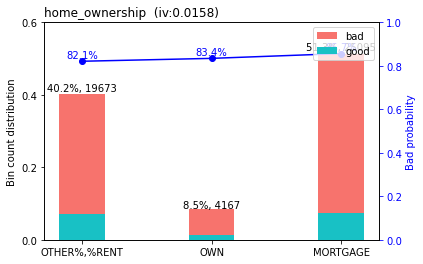

In [97]:
sc.woebin_plot(bins_adj)

**Светофоры по факторам**:\
*employment_known*: зеленый (нет промежутков немонотонности по default probability)\
*term*: зеленый (нет промежутков немонотонности по default probability)\
*loan_to_income*: зеленый (нет промежутков немонотонности по default probability)\
*emp_title_length*: зеленый (нет промежутков немонотонности по default probability)\
*home_ownership*: зеленый (нет промежутков немонотонности по default probability)\
*dti*: зеленый (нет промежутков немонотонности по default probability)\
*avg_cur_bal*: зеленый (нет промежутков немонотонности по default probability)\
*avg_balance_to_funded_amnt*: зеленый (нет промежутков немонотонности по default probability)\
*tot_hi_cred_lim*: зеленый (нет промежутков немонотонности по default probability)\
*annual_inc*: зеленый (нет промежутков немонотонности по default probability)\
*funded_amnt*: зеленый (нет промежутков немонотонности по default probability)\
*num_accts_ever_120_pd*: зеленый (нет промежутков немонотонности по default probability)\
*grade*: зеленый (нет промежутков немонотонности по default probability)\
*addr_state*: зеленый (нет промежутков немонотонности по default probability)\
*purpose*: зеленый (нет промежутков немонотонности по default probability)\
*inq_last_6mths*: зеленый (нет промежутков немонотонности по default probability)\
*mth_inc_to_payment*: зеленый (нет промежутков немонотонности по default probability)\
*delinq_2yrs*: зеленый (нет промежутков немонотонности по default probability)\
\
**Итог**: светофор зеленый

### Сравнение прогнозного и фактического TR

In [98]:
def compare_target_rates(X_train, y_train, X_test, y_test, model):
    model.fit(X_train, y_train)
    preds = model.predict_proba(X_test)[:, 1]
    predicted = np.mean(preds)
    real = np.mean(y_test)
    
    print(abs(predicted - real) / real)
    
    fig = go.Figure()
    
    std = np.std(preds) * 1.96 / (len(preds) ** 0.5) #95%
    fig.add_trace(go.Scatter(x=[1, 1], y=[predicted - std, predicted + std], hovertemplate="CI 95%<extra></extra>", marker=dict(color='#9467BD', size=1), showlegend=False))
    fig.add_trace(go.Scatter(x=[0.95, 1.05], y=[predicted - std, predicted - std], hovertemplate="CI 95%<extra></extra>", marker=dict(color='#9467BD', size=1), showlegend=False))
    fig.add_trace(go.Scatter(x=[0.95, 1.05], y=[predicted + std, predicted + std], hovertemplate="CI 95%<extra></extra>", marker=dict(color='#9467BD', size=1), showlegend=False))
    
    std = np.std(preds) * 2.575 / (len(preds) ** 0.5) #99%
    fig.add_trace(go.Scatter(x=[1, 1], y=[predicted - std, predicted + std], hovertemplate="CI 99%<extra></extra>", marker=dict(color='#FECB52', size=1), showlegend=False))
    fig.add_trace(go.Scatter(x=[0.95, 1.05], y=[predicted - std, predicted - std], hovertemplate="CI 99%<extra></extra>", marker=dict(color='#FECB52', size=1), showlegend=False))
    fig.add_trace(go.Scatter(x=[0.95, 1.05], y=[predicted + std, predicted + std], hovertemplate="CI 99%<extra></extra>", marker=dict(color='#FECB52', size=1), showlegend=False))
    
    fig.add_trace(go.Scatter(x=[1], y=[predicted], marker=dict(color='#9467BD', size=10), hovertemplate="Predicted TR = %{y:.4f}<extra></extra>", mode='markers', name='Predicted'))
    fig.add_trace(go.Scatter(x=[1], y=[real], marker=dict(color='#FECB52', size=10), hovertemplate="Real TR = %{y:.4f}<extra></extra>", mode='markers', name='Real'))
    
    fig.update_xaxes(range=[0.5,1.5],visible=False, showticklabels=False)
    fig.update_yaxes(title='TR')
    fig.update_layout(title="Compare target rates")
    fig.show()

In [99]:
X_train = tr_newwoe.drop(columns = ['funded_amnt', 'installment', 'term', 'def', 'issue_year', 'issue_month'])
y_train = tr_newwoe['def']
X_test = test_newwoe.drop(columns = ['funded_amnt', 'installment', 'term', 'def', 'issue_year', 'issue_month'])
y_test = test_newwoe['def']
compare_target_rates(X_train, y_train, X_test, y_test, lr_woe)

0.03883157248770445


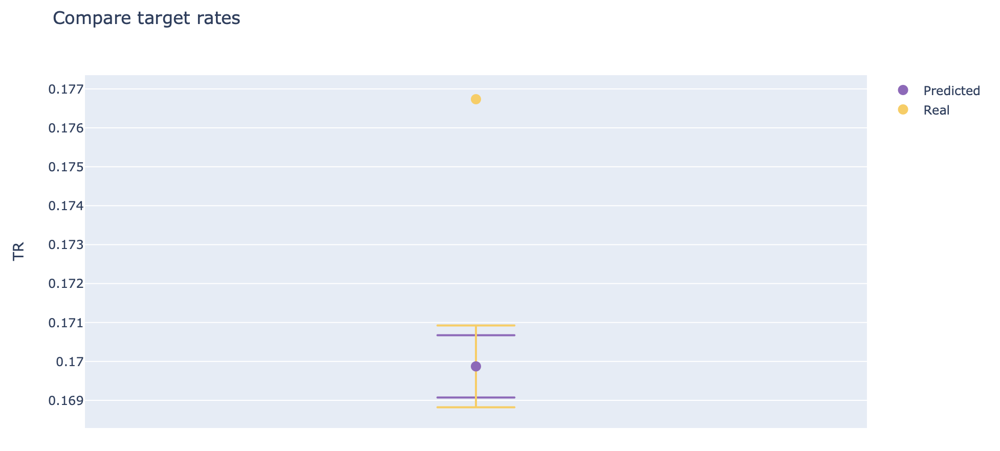

In [100]:
tr_new = tr_base.loc['train']
test_new = tr_base.loc['test']
X_train, midval_X_test, y_train, midval_y_test = train_test_split(tr_new.drop(columns = 'def'), tr_new['def'], test_size = 0.2, random_state = 42, stratify = tr_new['def'])
tr_new = pd.concat([X_train, y_train], axis=1)
X_train = tr_new.drop(columns = 'def')
y_train = tr_new['def']
X_test = test_new.drop(columns = 'def')
y_test = test_new['def']
compare_target_rates(X_train, y_train, X_test, y_test, grid_obj_xgbc)

0.0430699388134897


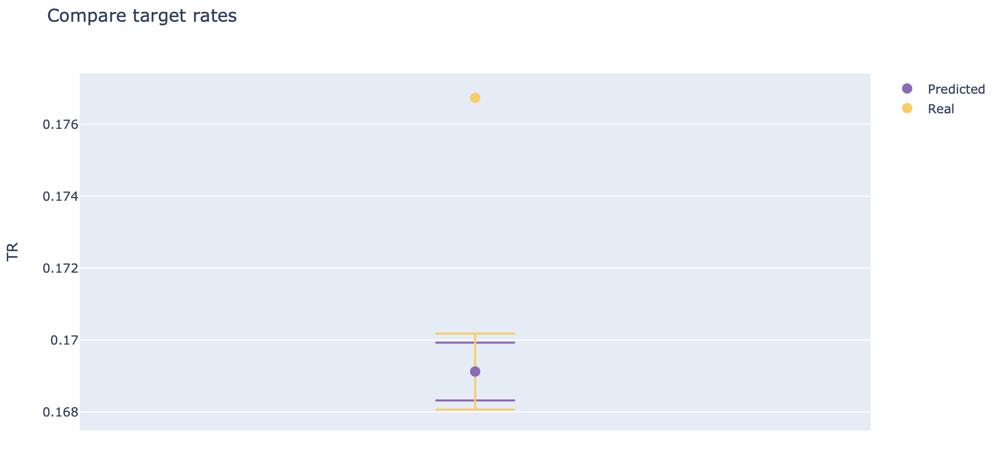

Светофор для логистической регрессии с woe-преобразованием (0.04) и градиентного бустинга (0.04) зеленый

### Тест формы калибровочной кривой

In [101]:
from sklearn.calibration import calibration_curve
def plot_calib_curve(X_train, y_train, X_test, y_test, model, bins_num=15):
    model.fit(X_train, y_train)
    preds = model.predict_proba(X_test)
    true, pred = calibration_curve(y_test, preds[:, 1], pos_label=None, n_bins=bins_num, strategy='uniform')
    
    print('Difference: ')
    c = 0
    for i in range(len(true)):
        print('Bucket ', i + 1, ': ', round(abs(true[i] - pred[i]) / true[i], 3), sep='')
        if round(abs(true[i] - pred[i]) / true[i], 3) > 0.2:
            c += 1
    print('% of buckets with difference > 20% is ', c / len(true) * 100, '%', sep='')
    
    fig = go.Figure()
    
    std = np.std(true) * 1.96 / (len(true) ** 0.5) #95%
    fig.add_trace(go.Scatter(x = [i + 1 for i in range(len(true))], y = true+std, hovertemplate="CI 95%<extra></extra>", line_color = 'rgba(148, 103, 189, 0)', showlegend = False))
    fig.add_trace(go.Scatter(x = [i + 1 for i in range(len(true))], y = true-std, hovertemplate="CI 95%<extra></extra>", line_color = 'rgba(148, 103, 189, 0)', name = '95% confidence interval', fill='tonexty', fillcolor = 'rgba(148, 103, 189, 0.2)'))
    
    std = np.std(true) * 2.575 / (len(true) ** 0.5) #99%
    fig.add_trace(go.Scatter(x = [i + 1 for i in range(len(true))], y = true+std, hovertemplate="CI 99%<extra></extra>", line_color = 'rgba(254, 203, 82, 0)', showlegend = False))
    fig.add_trace(go.Scatter(x = [i + 1 for i in range(len(true))], y = true-std, hovertemplate="CI 99%<extra></extra>", line_color = 'rgba(254, 203, 82, 0)', name = '99% confidence interval', fill='tonexty', fillcolor = 'rgba(254, 203, 82, 0.2)'))
    
    fig.add_trace(go.Scatter(x=[i + 1 for i in range(len(true))], y=pred, hovertemplate="Bucket = %{x}<br>Predicted TR = %{y:.4f}<extra></extra>", marker=dict(color='#FECB52', size=1), name='Prediction'))
    fig.add_trace(go.Scatter(x=[i + 1 for i in range(len(true))], y=true, hovertemplate="Bucket = %{x}<br>Real TR = %{y:.4f}<extra></extra>", marker=dict(color='#9467BD', size=5), mode = 'markers', name='True'))
    
    fig.update_xaxes(range=[1, len(true)], visible=True, showticklabels=True, title='Bucket')
    fig.update_yaxes(title='TR')
    fig.update_layout(title="Target rate by buckets (uniformly selected)")
    fig.show()

In [102]:
X_train = tr_newwoe.drop(columns = ['funded_amnt', 'installment', 'term', 'def', 'issue_year', 'issue_month'])
y_train = tr_newwoe['def']
X_test = test_newwoe.drop(columns = ['funded_amnt', 'installment', 'term', 'def', 'issue_year', 'issue_month'])
y_test = test_newwoe['def']
plot_calib_curve(X_train, y_train, X_test, y_test, lr_woe)

Difference: 
Bucket 1: 0.156
Bucket 2: 0.096
Bucket 3: 0.086
Bucket 4: 0.037
Bucket 5: 0.006
Bucket 6: 0.067
Bucket 7: 0.096
Bucket 8: 0.14
Bucket 9: 0.015
% of buckets with difference > 20% is 0.0%


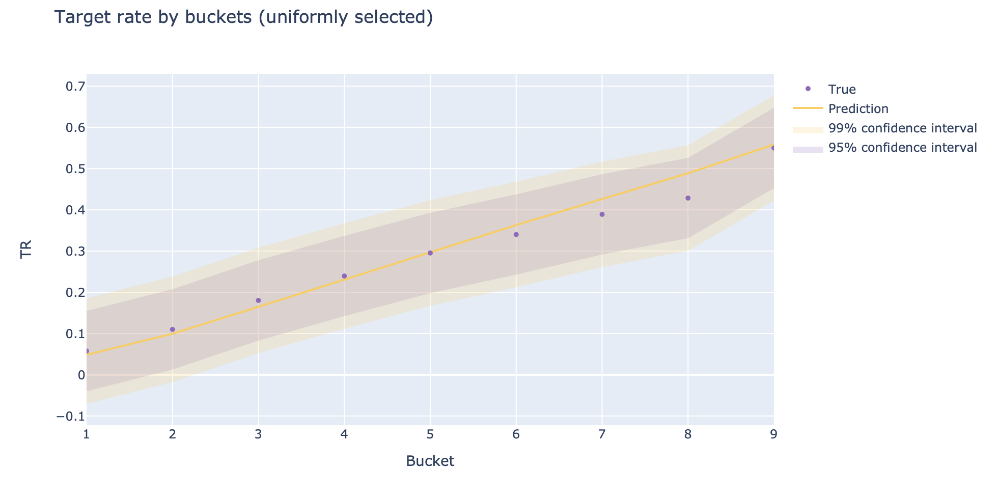

In [103]:
tr_new = tr_base.loc['train']
test_new = tr_base.loc['test']
X_train, midval_X_test, y_train, midval_y_test = train_test_split(tr_new.drop(columns = 'def'), tr_new['def'], test_size = 0.2, random_state = 42, stratify = tr_new['def'])
tr_new = pd.concat([X_train, y_train], axis=1)
X_train = tr_new.drop(columns = 'def')
y_train = tr_new['def']
X_test = test_new.drop(columns = 'def')
y_test = test_new['def']
plot_calib_curve(X_train, y_train, X_test, y_test, grid_obj_xgbc)

Difference: 
Bucket 1: 0.177
Bucket 2: 0.089
Bucket 3: 0.074
Bucket 4: 0.026
Bucket 5: 0.017
Bucket 6: 0.065
Bucket 7: 0.022
Bucket 8: 0.036
Bucket 9: 0.304
Bucket 10: 0.396
% of buckets with difference > 20% is 20.0%


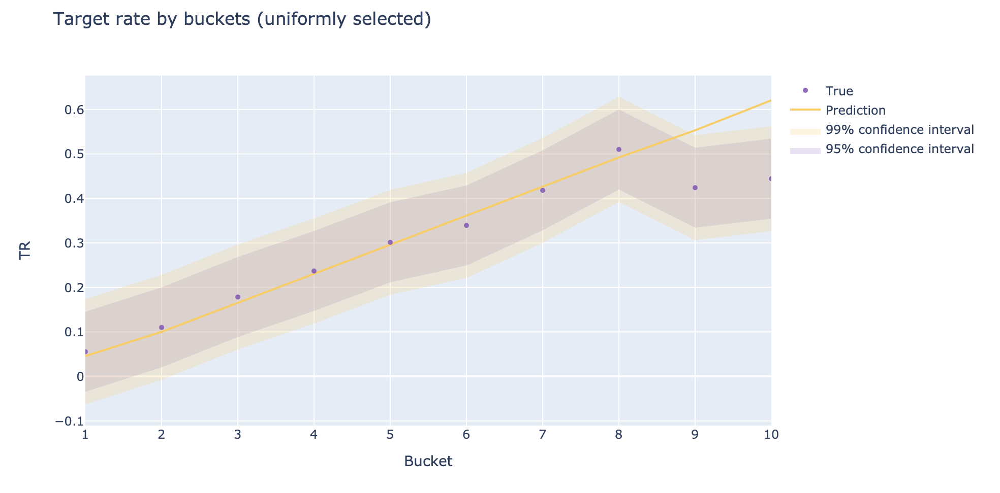

Светофор для логистической регрессии с woe-преобразованием (0%) зеленый; для градиентного бустинга (20%) желтый

### Сравнение эффективности ранжирования модели на разработке и валидации

In [104]:
def rocauc_gini_train_test(X_train, y_train, midval_X_test, midval_y_test, X_test, y_test, model):
    
    model.fit(X_train, y_train)
    preds = model.predict_proba(midval_X_test)
    preds2 = model.predict_proba(X_test)
    ginis = {'gini': [roc_auc_score(midval_y_test, preds[:, 1]) * 2 - 1, roc_auc_score(y_test, preds2[:, 1]) * 2 - 1],
            'train_test': ['train', 'test']}
    
    print("Абсолютное изменение:   ", ginis['gini'][1] - ginis['gini'][0])
    print("Относительное изменение:", (ginis['gini'][1] - ginis['gini'][0]) / ginis['gini'][0])
    
    ginis = pd.DataFrame(ginis)
    fig = px.bar(ginis, x="train_test", y="gini", title='Gini by features: train & test')
    fig.update_traces(marker_color='#9467BD')
    fig.show()

In [105]:
X_train = tr_newwoe.drop(columns = ['funded_amnt', 'installment', 'term', 'def', 'issue_year', 'issue_month'])
y_train = tr_newwoe['def']
midval_X_test = midval_newwoe.drop(columns = ['funded_amnt', 'installment', 'term', 'def', 'issue_year', 'issue_month'])
midval_y_test = midval_newwoe['def']
X_test = test_newwoe.drop(columns = ['funded_amnt', 'installment', 'term', 'def', 'issue_year', 'issue_month'])
y_test = test_newwoe['def']
rocauc_gini_train_test(X_train, y_train, midval_X_test, midval_y_test, X_test, y_test, lr_woe)

Абсолютное изменение:    -0.009878977668725364
Относительное изменение: -0.026982275879383313


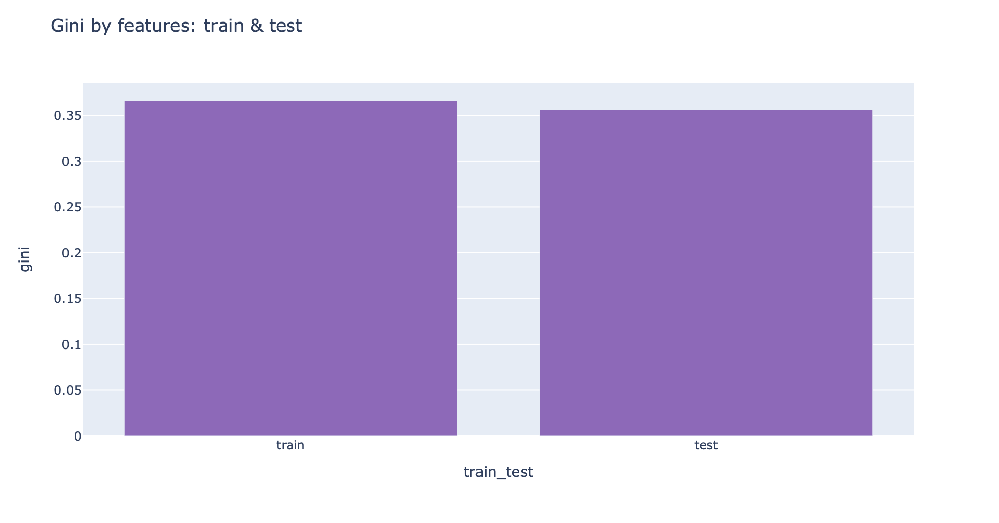

In [106]:
tr_new = tr_base.loc['train']
test_new = tr_base.loc['test']
X_train, midval_X_test, y_train, midval_y_test = train_test_split(tr_new.drop(columns = 'def'), tr_new['def'], test_size = 0.2, random_state = 42, stratify = tr_new['def'])
tr_new = pd.concat([X_train, y_train], axis=1)
midval_new = pd.concat([midval_X_test, midval_y_test], axis=1)
X_train = tr_new.drop(columns = 'def')
y_train = tr_new['def']
midval_X_test = midval_new.drop(columns = 'def')
midval_y_test = midval_new['def']
X_test = test_new.drop(columns = 'def')
y_test = test_new['def']
rocauc_gini_train_test(X_train, y_train, midval_X_test, midval_y_test, X_test, y_test, grid_obj_xgbc)

Абсолютное изменение:    -0.008542714573852805
Относительное изменение: -0.022617388189389766


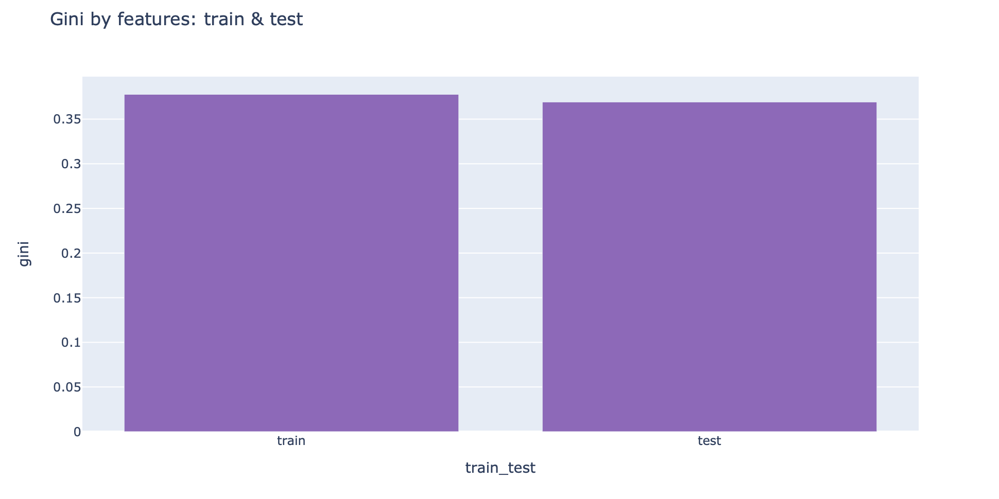

Светофор для логистической регрессии с woe-преобразованием (абсолютное снижение 1 п.п. < 3 п.п.) и градиентного бустинга (абсолютное снижение 1 п.п. < 3 п.п.) зеленый

### Сравнение эффективности ранжирования отдельных факторов модели на разработке и валидации

In [107]:
def feature_gini_train_test(X_train, y_train, midval_X_test, midval_y_test, X_test, y_test, model):
    
    ginis = {'feature': [], 'gini': [], 'train_test': []}
    gini_change = []
    for x in X_train.columns:
        trainx = pd.DataFrame(X_train[x])
        midvalx = pd.DataFrame(midval_X_test[x])
        testx = pd.DataFrame(X_test[x])
        
        model.fit(trainx, y_train)
        
        preds2 = model.predict_proba(midvalx)
        ginis['feature'].append(x)
        ginis['gini'].append(roc_auc_score(midval_y_test, preds2[:, 1]) * 2 - 1)
        ginis['train_test'].append('midval')
        
        preds = model.predict_proba(testx)
        ginis['feature'].append(x)
        ginis['gini'].append(roc_auc_score(y_test, preds[:, 1]) * 2 - 1)
        ginis['train_test'].append('test')
        
        gini_change.append((x, (roc_auc_score(y_test, preds[:, 1]) * 2 - 1) - (roc_auc_score(midval_y_test, preds2[:, 1]) * 2 - 1), ((roc_auc_score(y_test, preds[:, 1]) * 2 - 1) - (roc_auc_score(midval_y_test, preds2[:, 1]) * 2 - 1)) / (roc_auc_score(midval_y_test, preds2[:, 1]) * 2 - 1)))
    
    for x in gini_change:
        if round(x[1], 3) > -0.03 or round(x[2], 3) > -0.15:
            colour = 'зеленый'
        elif round(x[1], 3) < -0.05 and round(x[2], 3) < -0.2:
            colour = 'красный'
        else:
            colour = 'желтый'
        print(x[0], ': абс. изм. = ', round(x[1], 3), ', относ. изм. = ', round(x[2], 3), ', цвет = ', colour, sep='')
    
    df = pd.DataFrame(ginis)
    fig = px.bar(df, x="feature", y="gini", color='train_test', barmode='group', color_discrete_map={'midval': '#9467BD', 'test': '#FECB52'}, title='Gini by features: train & test')
    fig.show()

In [108]:
X_train = tr_newwoe.drop(columns = ['funded_amnt', 'installment', 'term', 'def', 'issue_year', 'issue_month'])
y_train = tr_newwoe['def']
midval_X_test = midval_newwoe.drop(columns = ['funded_amnt', 'installment', 'term', 'def', 'issue_year', 'issue_month'])
midval_y_test = midval_newwoe['def']
X_test = test_newwoe.drop(columns = ['funded_amnt', 'installment', 'term', 'def', 'issue_year', 'issue_month'])
y_test = test_newwoe['def']
feature_gini_train_test(X_train, y_train, midval_X_test, midval_y_test, X_test, y_test, lr_woe)

purpose_woe: абс. изм. = -0.033, относ. изм. = -0.358, цвет = желтый
tot_hi_cred_lim_woe: абс. изм. = 0.019, относ. изм. = 0.233, цвет = зеленый
avg_balance_to_funded_amnt_woe: абс. изм. = 0.009, относ. изм. = 0.11, цвет = зеленый
addr_state_woe: абс. изм. = -0.017, относ. изм. = -0.604, цвет = зеленый
term_woe: абс. изм. = -0.076, относ. изм. = -0.38, цвет = красный
delinq_2yrs_woe: абс. изм. = 0.002, относ. изм. = 0.438, цвет = зеленый
avg_cur_bal_woe: абс. изм. = 0.012, относ. изм. = 0.145, цвет = зеленый
funded_amnt_woe: абс. изм. = -0.05, относ. изм. = -0.553, цвет = желтый
inq_last_6mths_woe: абс. изм. = 0.007, относ. изм. = 0.081, цвет = зеленый
grade_woe: абс. изм. = 0.02, относ. изм. = 0.063, цвет = зеленый
emp_title_length_woe: абс. изм. = 0.028, относ. изм. = 1.213, цвет = зеленый
employment_known_woe: абс. изм. = 0.01, относ. изм. = 0.807, цвет = зеленый
loan_to_income_woe: абс. изм. = -0.032, относ. изм. = -0.184, цвет = желтый
home_ownership_woe: абс. изм. = 0.057, относ.

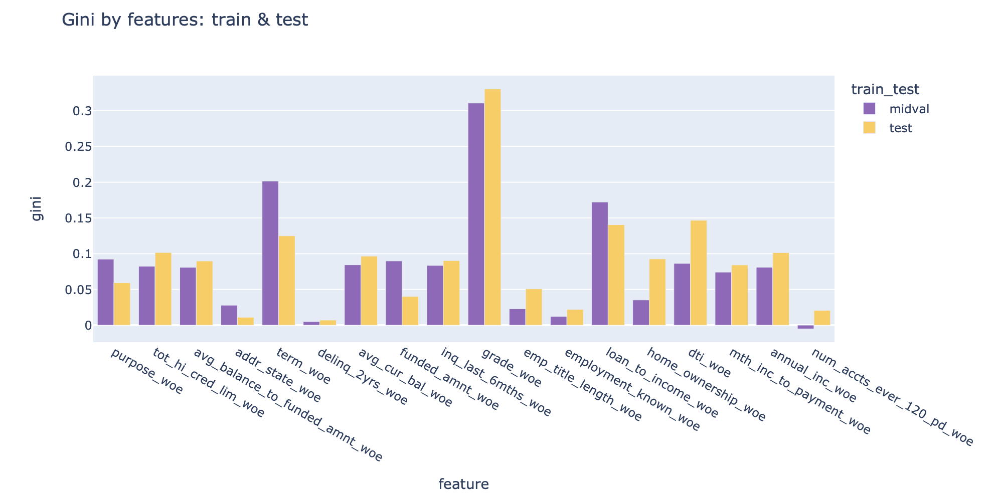

In [109]:
tr_new = tr_base.loc['train']
test_new = tr_base.loc['test']
X_train, midval_X_test, y_train, midval_y_test = train_test_split(tr_new.drop(columns = 'def'), tr_new['def'], test_size = 0.2, random_state = 42, stratify = tr_new['def'])
tr_new = pd.concat([X_train, y_train], axis=1)
midval_new = pd.concat([midval_X_test, midval_y_test], axis=1)
X_train = tr_new.drop(columns = 'def')
y_train = tr_new['def']
midval_X_test = midval_new.drop(columns = 'def')
midval_y_test = midval_new['def']
X_test = test_new.drop(columns = 'def')
y_test = test_new['def']
feature_gini_train_test(X_train, y_train, midval_X_test, midval_y_test, X_test, y_test, grid_obj_xgbc)

dti: абс. изм. = 0.057, относ. изм. = 0.639, цвет = зеленый
funded_amnt: абс. изм. = -0.051, относ. изм. = -0.441, цвет = красный
annual_inc: абс. изм. = 0.018, относ. изм. = 0.217, цвет = зеленый
emp_length: абс. изм. = 0.012, относ. изм. = 0.7, цвет = зеленый
inq_last_6mths: абс. изм. = 0.007, относ. изм. = 0.079, цвет = зеленый
mths_since_recent_inq: абс. изм. = 0.011, относ. изм. = 0.153, цвет = зеленый
delinq_2yrs: абс. изм. = 0.002, относ. изм. = 0.438, цвет = зеленый
chargeoff_within_12_mths: абс. изм. = -0.0, относ. изм. = -0.214, цвет = зеленый
num_accts_ever_120_pd: абс. изм. = 0.026, относ. изм. = -5.008, цвет = зеленый
num_tl_90g_dpd_24m: абс. изм. = 0.005, относ. изм. = -6.975, цвет = зеленый
acc_open_past_24mths: абс. изм. = 0.042, относ. изм. = 0.368, цвет = зеленый
avg_cur_bal: абс. изм. = 0.034, относ. изм. = 0.555, цвет = зеленый
tot_hi_cred_lim: абс. изм. = 0.02, относ. изм. = 0.262, цвет = зеленый
delinq_amnt: абс. изм. = -0.0, относ. изм. = -0.296, цвет = зеленый
e

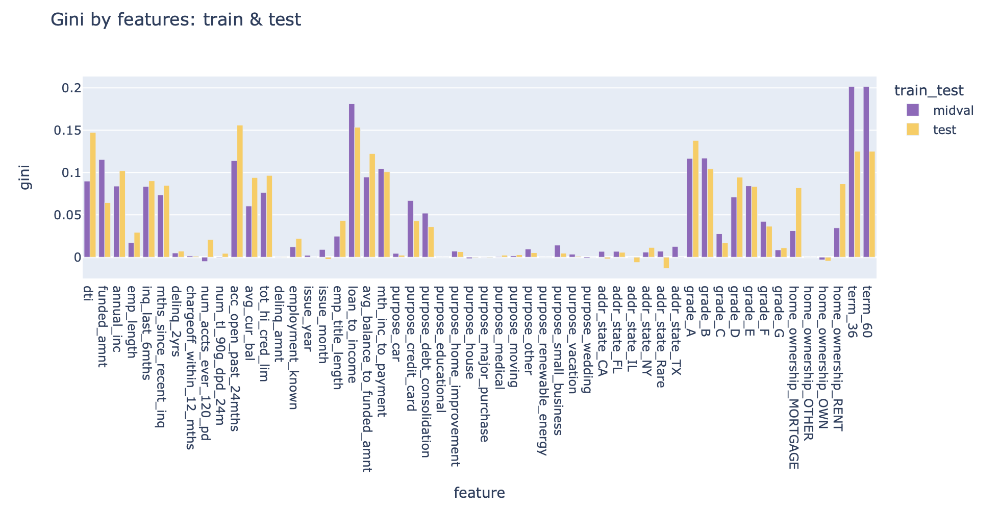

Светофор для обеих моделей красный, поскольку присутствуют красные признаки (для woe-регрессии 6% красных признаков и 17% желтых признаков; для градиентного бустинга 6% красных признаков и 0% желтых признаков)